# EDA
1. Examining factors that influence working over the required working hours and under the required working hours.
2. Conducting association rule analysis to identify factors influencing the mismatch between highest qualifications and employment qualifications.
3. Investigating how individuals address the skill gap when they lack the necessary qualifications in their current profession

In [1]:
import pandas  as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Preparing data

In [2]:
df = pd.read_csv('data_sorted.csv')
codebook = pd.read_excel('PIAAC\Cycle 1\International Codebook_PIAAC Public-use File (PUF) Variables and Values.xlsx')

print(df.shape)
df.head()

C:\Users\Anis\AppData\Local\Temp\ipykernel_35176\2046365629.py:1: DtypeWarning: Columns (47) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('data_sorted.csv')


(11470, 93)


,Skill use work - ICT - Computer - How often - Programming language,ISCO1C,Skill use work - ICT - Computer - How often - Real-time discussions,Skill use work - How often - Organising own time,Skill use everyday life - ICT - Computer - How often - Word,Skill use work - How often - Planning others activities,PVPSL6,About yourself - Learning strategies - Attribute something new,ICTHOME,PVPSL8,...,Education - Highest qualification - Level,PVPSL4,PVPSL10,Skill use everyday life - ICT - Internet - How often - In order to better understand various issues,About yourself - Learning strategies - Get to the bottom of difficult things,WorkHours,WorkHours_Difference,Qualification_Comparision,Qualification_Status,PVPSL_Performance
0,At least once a week but not every day,Service workers and shop and market sales workers,Less than once a month,Every day,Less than once a week but at least once a month,Never,315.18911,To a high extent,2.021940,296.26412,...,"ISCED 5A, bachelor degree",342.29315,318.98045,Less than once a week but at least once a month,To a high extent,Over Average,18,Over by 5 level(s),Over,Moderate performer
1,Less than once a week but at least once a month,Professionals,Never,Every day,Never,Less than once a month,326.64999,To some extent,1.646234,273.53912,...,"ISCED 5A, bachelor degree",325.28718,296.98809,At least once a week but not every day,To a high extent,Over Average,8,Equal,Equal,Moderate performer
2,Never,"Legislators, senior officials and managers",At least once a week but not every day,Every day,At least once a week but not every day,At least once a week but not every day,285.41693,To some extent,3.430657,279.23163,...,"ISCED 5A, bachelor degree",316.26258,249.59748,Every day,Very little,Over Average,18,Under by 2 level(s),Under,Weak performer
3,Never,Service workers and shop and market sales workers,Never,Less than once a month,Less than once a month,Never,332.55340,To a high extent,1.623673,284.82134,...,ISCED 5B,318.41257,325.03424,At least once a week but not every day,To some extent,Under Average,-15,Over by 5 level(s),Over,Moderate performer
4,Never,Technicians and associate professionals,Never,Never,Never,Never,300.41854,To some extent,1.365424,290.70099,...,ISCED 3C 2 years or more,307.69612,307.37447,Less than once a month,Very little,Under Average,-10,Over by 1 level(s),Over,Moderate performer


In [4]:
# variables

demographic_var = ['CNTRYID', 'AGE_R', 'GENDER_R', 'LNG_HOME', 'NATIVELANG', 'NATIVESPEAKER', 'J_Q06b', 'J_Q07b', 'I_Q08', 'J_Q04a']
eduwork_var = ['CNTRYID', 'C_Q07', 'C_D06', 'B_Q01a', 'B_Q01a3', 'B_Q01b', 'D_Q12a', 'B_Q05c', 'B_Q10c', 'D_Q14', 'ISCOSKIL4', 'ISCO1C', 'ISCO2C', 'D_Q10', 'D_Q03', 'D_Q04', 'D_Q07a', 'D_Q07b', 'D_Q08a', 'D_Q08b', 'VET', 'NFEHRS']

worksl_var = ['CNTRYID', 'ICTWORK', 'NFEHRSJR']
worksl_var.extend(codebook.loc[codebook['Name'].str.startswith('F_'), 'Name'].tolist())
worksl_var.extend(codebook.loc[codebook['Name'].str.startswith('G_') & codebook['Label'].str.contains('ICT'), 'Name'].tolist())

lifesl_var = ['CNTRYID', 'ICTHOME', 'NFEHRSNJR']
lifesl_var.extend(codebook.loc[codebook['Name'].str.startswith('H_') & codebook['Label'].str.contains('ICT'), 'Name'].tolist())
lifesl_var.extend(codebook.loc[codebook['Name'].str.startswith('I_') & codebook['Label'].str.contains('Learning'), 'Name'].tolist())

pvpsl = []
pvpsl.extend(codebook.loc[codebook['Name'].str.startswith('PVPSL'), 'Name'].tolist())


vars = list(set(demographic_var + eduwork_var + worksl_var + lifesl_var + pvpsl))
vars_keep = [var for var in vars if not (var[0].isalpha() and var[1] == '_')]
vars_change = [var for var in vars if var[0].isalpha() and var[1] == '_']

vars_dict = {}

for i in vars_change:
    match = codebook.loc[codebook['Name'] == i, 'Label'].tolist()
    if match:
        vars_dict[i] = match[0]


demographic_mapped = [vars_dict.get(value, value) if value is not None else None for value in demographic_var]
eduwork_mapped = [vars_dict.get(value, value) if value is not None else None for value in eduwork_var]
worksl_mapped = [vars_dict.get(value, value) if value is not None else None for value in worksl_var]
lifesl_mapped = [vars_dict.get(value, value) if value is not None else None for value in lifesl_var]

hours_var = ['WorkHours', 'WorkHours_Difference']
match_var = ['Qualification_Comparision', 'Qualification_Status']
performance_var = 'PVPSL_Performance'

print(len(demographic_mapped) + len(eduwork_mapped) + len(worksl_mapped) + len(lifesl_mapped) + len(hours_var) + len(match_var) + len(performance_var))

102


# Total Numbers

In [88]:
print(df['WorkHours'].unique())
print(df['Qualification_Status'].unique())

['Over Average' 'Under Average' 'Average']
['Over' 'Equal' 'Under']


In [89]:
hours_over = df[df['WorkHours'] == 'Over Average']
hours_under = df[df['WorkHours'] == 'Under Average']
hours_avg = df[df['WorkHours'] == 'Average']

match_over = df[df['Qualification_Status'] == 'Over']
match_under = df[df['Qualification_Status'] == 'Under']
match_equal = df[df['Qualification_Status'] == 'Equal']


print('Over Hours: ', len(hours_over))
print('Under Hours: ', len(hours_under))
print()
print('Equal and Over Match: ', len(match_over + match_equal))
print('Under Match: ', len(match_under))

Over Hours:  3250
Under Hours:  3347

Equal and Over Match:  9800
Under Match:  1670


# Working Hours EDA
https://stackoverflow.com/questions/49044131/how-to-add-data-labels-to-seaborn-countplot-factorplot

corr matrix / heatmap * 2ea pick by results if byk then fs ex rf ranking

In [90]:
# styling the plot outputs

sns.set_palette("dark")
sns.set_style('darkgrid')
sns.set(font_scale=1.1)

In [91]:
# hours_var = ['WorkHours', 'WorkHours_Difference']
# match_var = ['Qualification_Comparision', 'Qualification_Status']
# performance_var = 'PVPSL_Performance'

In [92]:
countries = df['CNTRYID'].unique()

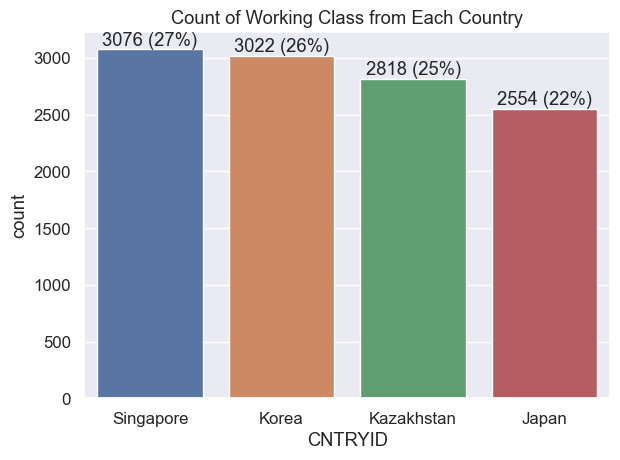

In [93]:
ax = sns.countplot(x=df['CNTRYID'],
                order=df['CNTRYID'].value_counts(ascending=False).index);
        
abs_values = df['CNTRYID'].value_counts(ascending=False)
rel_values = df['CNTRYID'].value_counts(ascending=False, normalize=True).values * 100
lbls = [f'{p[0]} ({p[1]:.0f}%)' for p in zip(abs_values, rel_values)]

ax.bar_label(container=ax.containers[0], labels=lbls)

plt.title('Count of Working Class from Each Country')
plt.tight_layout()
plt.show()

## Working Hours

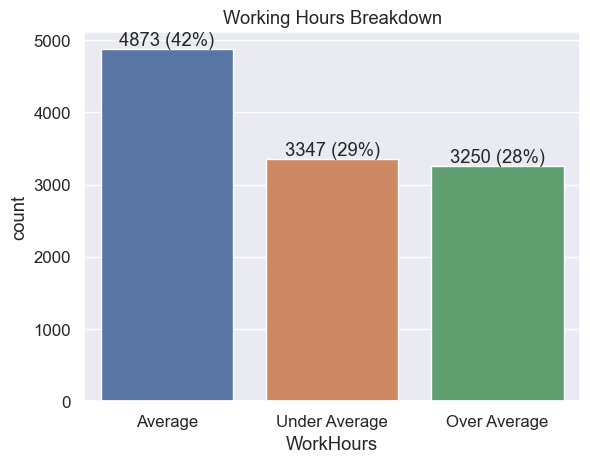

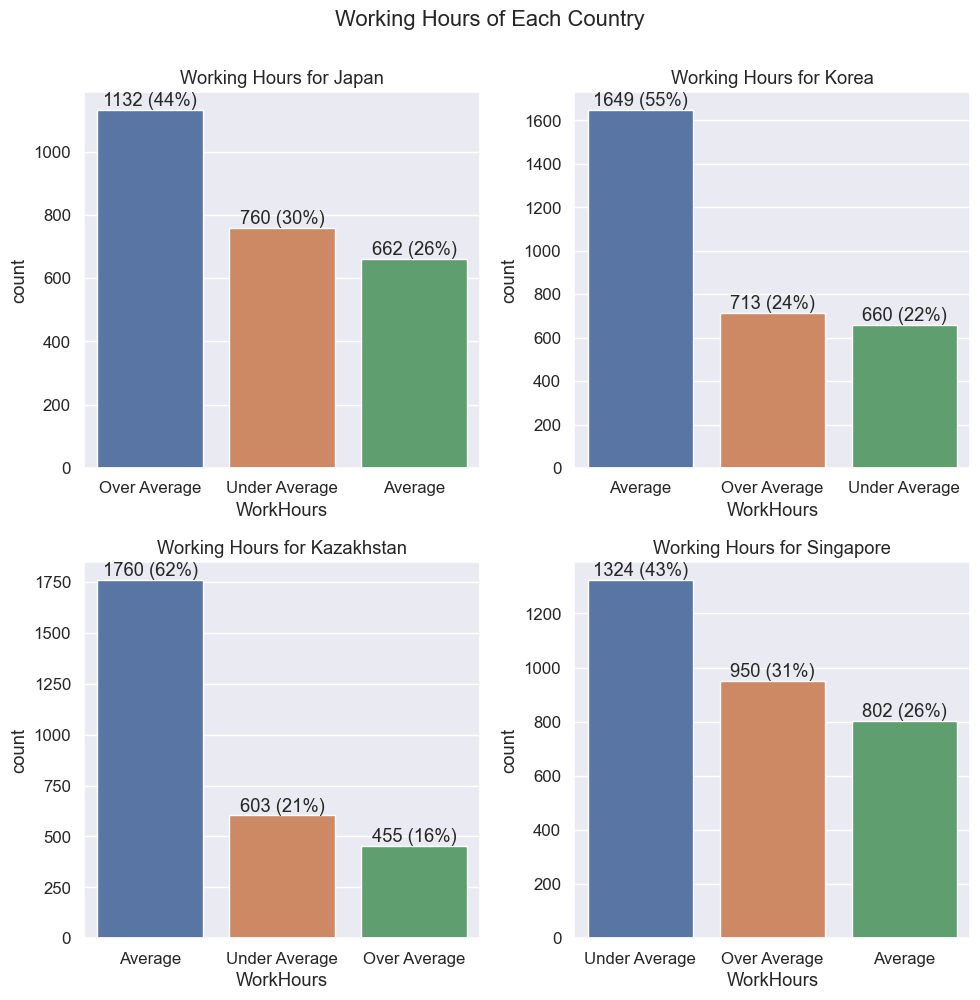

In [94]:
ax = sns.countplot(x=df['WorkHours'],
                   order=df['WorkHours'].value_counts(ascending=False).index);
        
abs_values = df['WorkHours'].value_counts(ascending=False)
rel_values = df['WorkHours'].value_counts(ascending=False, normalize=True).values * 100
lbls = [f'{p[0]} ({p[1]:.0f}%)' for p in zip(abs_values, rel_values)]

ax.bar_label(container=ax.containers[0], labels=lbls)

plt.title('Working Hours Breakdown')
plt.show()


plt.figure(figsize=(10, 10))

for i in range(len(countries)):
    current = df[df['CNTRYID']  == countries[i]]
    
    plt.subplot(2,2,i+1)
    ax = sns.countplot(x=current['WorkHours'],
                    order=current['WorkHours'].value_counts(ascending=False).index);
            
    abs_values = current['WorkHours'].value_counts(ascending=False)
    rel_values = current['WorkHours'].value_counts(ascending=False, normalize=True).values * 100
    lbls = [f'{p[0]} ({p[1]:.0f}%)' for p in zip(abs_values, rel_values)]
    
    ax.bar_label(container=ax.containers[0], labels=lbls)
    
    plt.title('Working Hours for ' + countries[i])

plt.suptitle('Working Hours of Each Country', y=1)
plt.tight_layout()
plt.show()

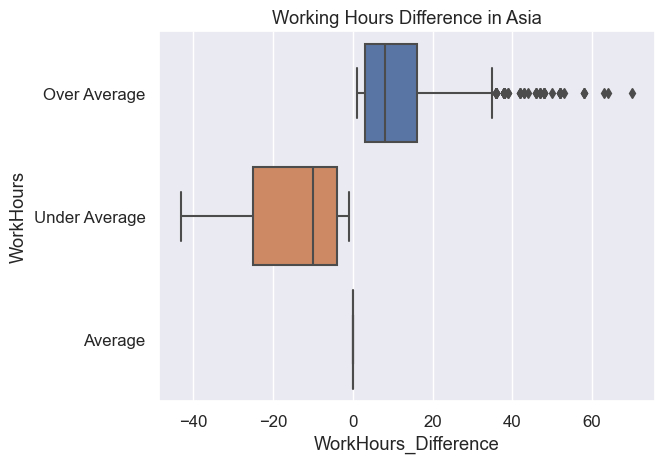

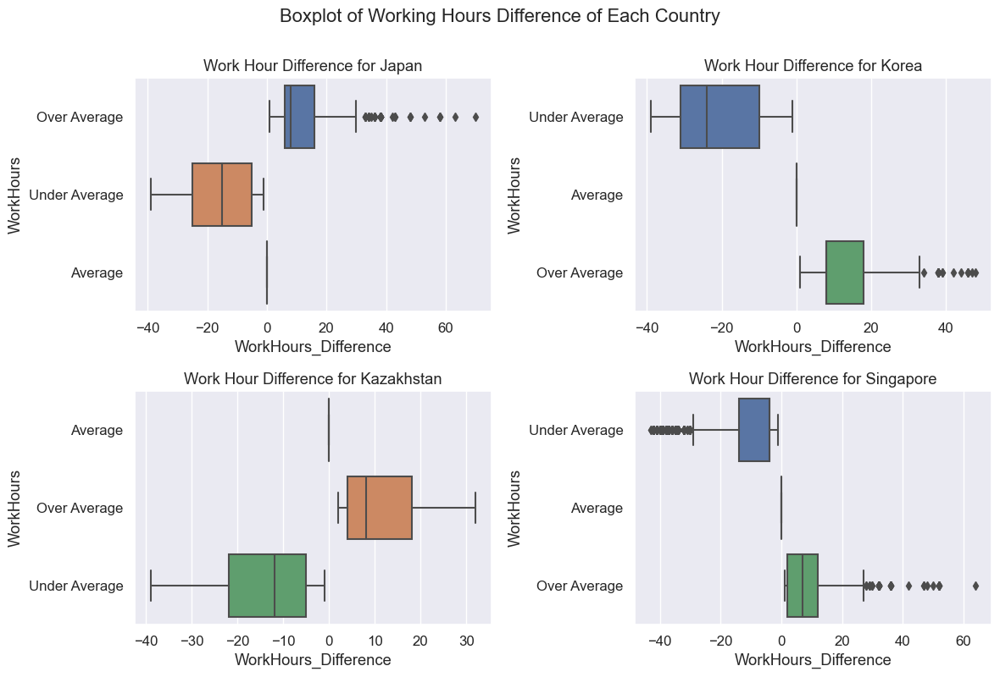

Japan  :  Over Average
Q1: 6.0
Median: 8.0
Q3: 16.0
IQR: 10.0

Japan  :  Under Average
Q1: -25.0
Median: -15.0
Q3: -5.0
IQR: 20.0

Japan  :  Average
Q1: 0.0
Median: 0.0
Q3: 0.0
IQR: 0.0

Korea  :  Over Average
Q1: 8.0
Median: 8.0
Q3: 18.0
IQR: 10.0

Korea  :  Under Average
Q1: -31.0
Median: -24.0
Q3: -10.0
IQR: 21.0

Korea  :  Average
Q1: 0.0
Median: 0.0
Q3: 0.0
IQR: 0.0

Kazakhstan  :  Over Average
Q1: 4.0
Median: 8.0
Q3: 18.0
IQR: 14.0

Kazakhstan  :  Under Average
Q1: -22.0
Median: -12.0
Q3: -5.0
IQR: 17.0

Kazakhstan  :  Average
Q1: 0.0
Median: 0.0
Q3: 0.0
IQR: 0.0

Singapore  :  Over Average
Q1: 2.0
Median: 7.0
Q3: 12.0
IQR: 10.0

Singapore  :  Under Average
Q1: -14.0
Median: -4.0
Q3: -4.0
IQR: 10.0

Singapore  :  Average
Q1: 0.0
Median: 0.0
Q3: 0.0
IQR: 0.0



In [95]:
sns.boxplot(data=df, x='WorkHours_Difference', y='WorkHours')
plt.title('Working Hours Difference in Asia')
plt.show()

plt.figure(figsize=(12, 8))

for i in range(len(countries)):
    current = df[df['CNTRYID']  == countries[i]]
    
    plt.subplot(2,2,i+1)
    sns.boxplot(data=current, x='WorkHours_Difference', y='WorkHours')
    
    plt.title('Work Hour Difference for ' + countries[i])

plt.suptitle('Boxplot of Working Hours Difference of Each Country', y=1)
plt.tight_layout()
plt.show()

for i in range(len(countries)):
    for hrs in df['WorkHours'].unique():
        current = df[(df['CNTRYID'] == countries[i]) & (df['WorkHours'] == hrs)]
        current = current['WorkHours_Difference']
                
        q1 = np.percentile(current, 25)
        median = np.percentile(current, 50)
        q3 = np.percentile(current, 75)
        iqr = q3 - q1

        print(countries[i], ' : ', hrs)
        print("Q1:", q1)
        print("Median:", median)
        print("Q3:", q3)
        print("IQR:", iqr)
        print()

## Job Matching

## PVPSL

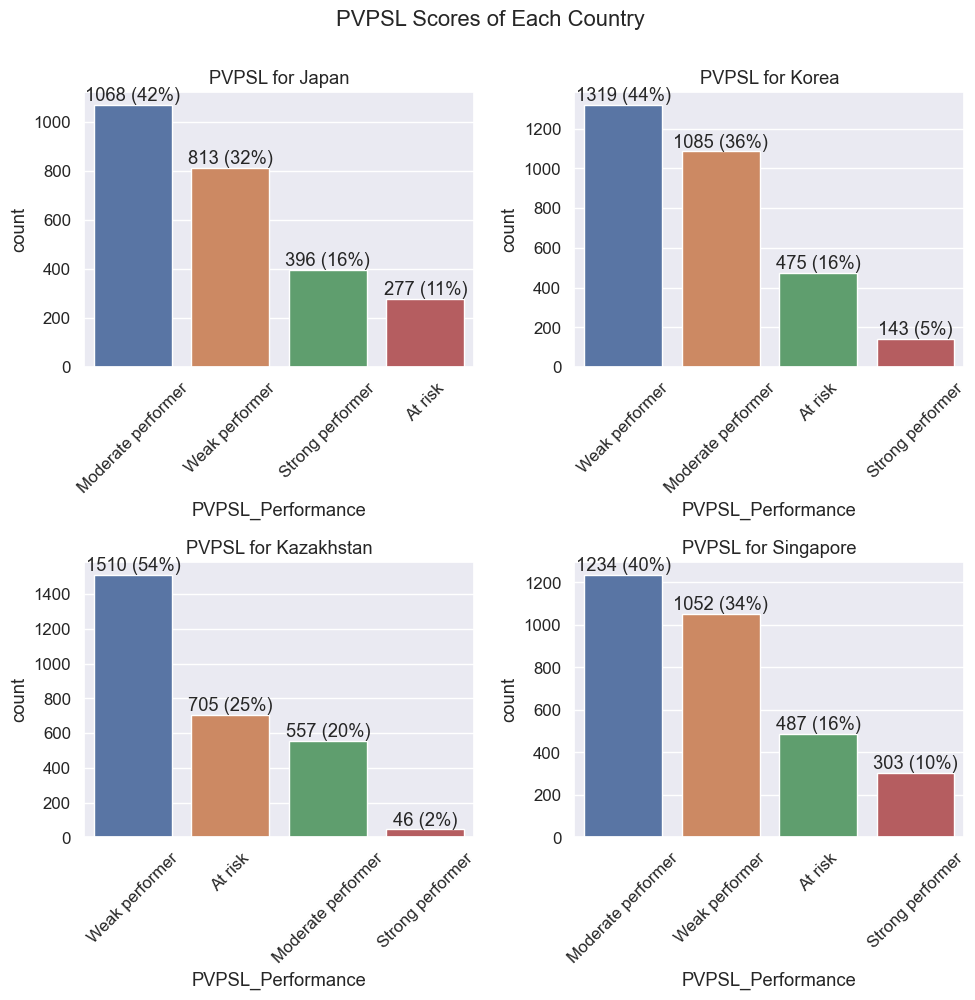

In [96]:
plt.figure(figsize=(10, 10))

for i in range(len(countries)):
    current = df[df['CNTRYID']  == countries[i]]
    
    plt.subplot(2,2,i+1)
    ax = sns.countplot(x=current[performance_var],
                    order=current[performance_var].value_counts(ascending=False).index);
            
    abs_values = current[performance_var].value_counts(ascending=False)
    rel_values = current[performance_var].value_counts(ascending=False, normalize=True).values * 100
    lbls = [f'{p[0]} ({p[1]:.0f}%)' for p in zip(abs_values, rel_values)]
    
    ax.bar_label(container=ax.containers[0], labels=lbls)
    
    plt.xticks(rotation=45)
    plt.title('PVPSL for ' + countries[i])

plt.suptitle('PVPSL Scores of Each Country', y=1)
plt.tight_layout()
plt.show()

## Skill Use Index, Informal Learning Hours, and Working Hours

In [97]:
skills = ['ICTHOME', 'ICTWORK']
infhours = ['NFEHRS', 'NFEHRSJR', 'NFEHRSNJR']
infhours_name = ['Number of hours of participation in non-formal education',
                 'Number of hours of participation in non-formal education for job-related reasons',
                 'Number of hours of participation in non-formal education for job-related reasons']
workhours = ['Current work - Hours/week', 'WorkHours_Difference']

# - NFEHRS          Number of hours of participation in non-formal education (derived)
# - NFEHRSJR      Number of hours of participation in non-formal education for job-related reasons (derived)
# - NFEHRSNJR     Number of hours of participation in non-formal education for non-job-related reasons (derived)

df_num = df.copy()

for col in infhours:
    df_num[col] = pd.to_numeric(df_num[col], errors='coerce')  # Convert to numeric, handle errors if any

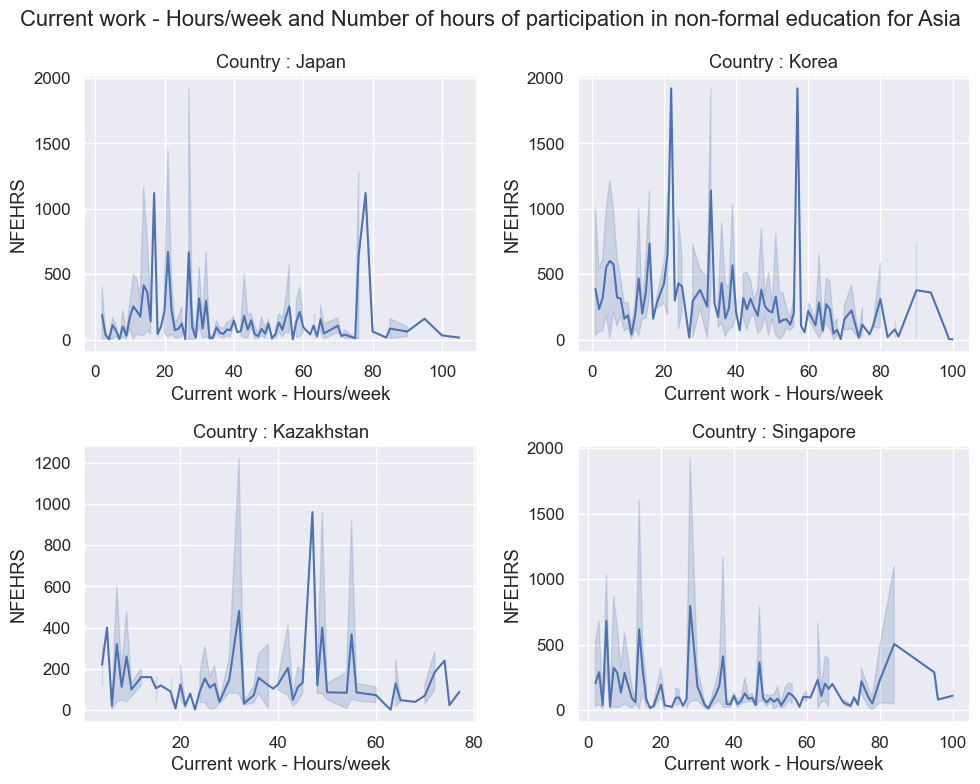

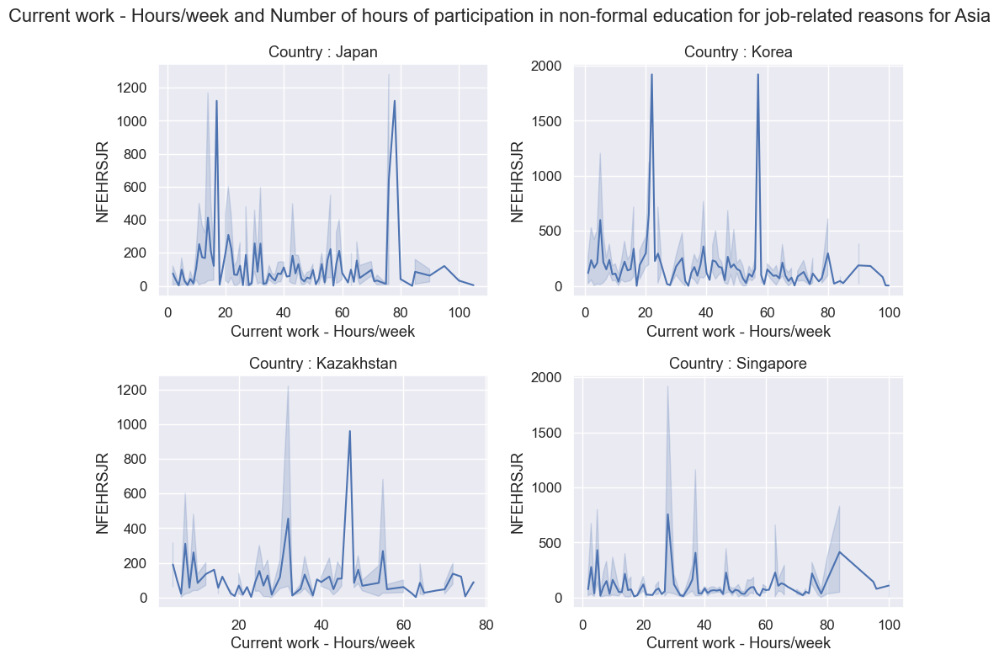

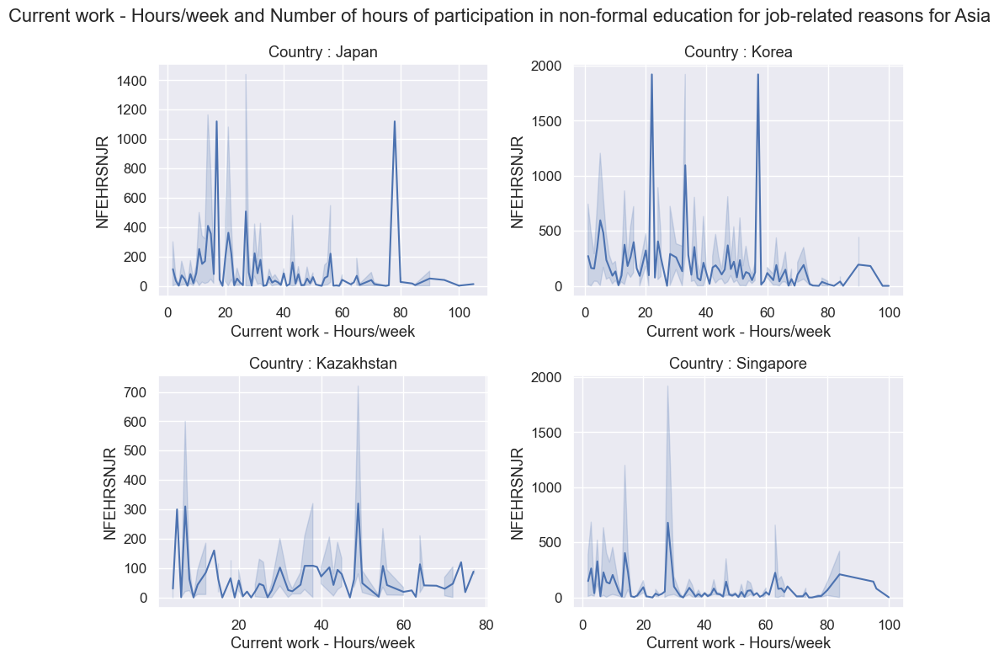

In [98]:
for col, name in zip(infhours, infhours_name):
    plt.figure(figsize=(10, 8))

    for i in range(len(countries)):
        current = df_num[df_num['CNTRYID'] == countries[i]]
        
        plt.subplot(2,2,i+1)
        sns.lineplot(data=current, x=workhours[0], y=col)
        
        plt.title('Country : ' + countries[i])

    plt.suptitle(workhours[0] + ' and ' + name + ' for Asia')
    plt.tight_layout()
    plt.show()

## Socio-demographic

In [99]:
df[demographic_mapped].dtypes

CNTRYID                                                             object
AGE_R                                                               object
GENDER_R                                                            object
LNG_HOME                                                            object
NATIVELANG                                                          object
NATIVESPEAKER                                                       object
Background - Mother/female guardian - Highest level of education    object
Background - Father/male guardian - Highest level of education      object
About yourself - Health - State                                     object
Background - Born in country                                        object
dtype: object

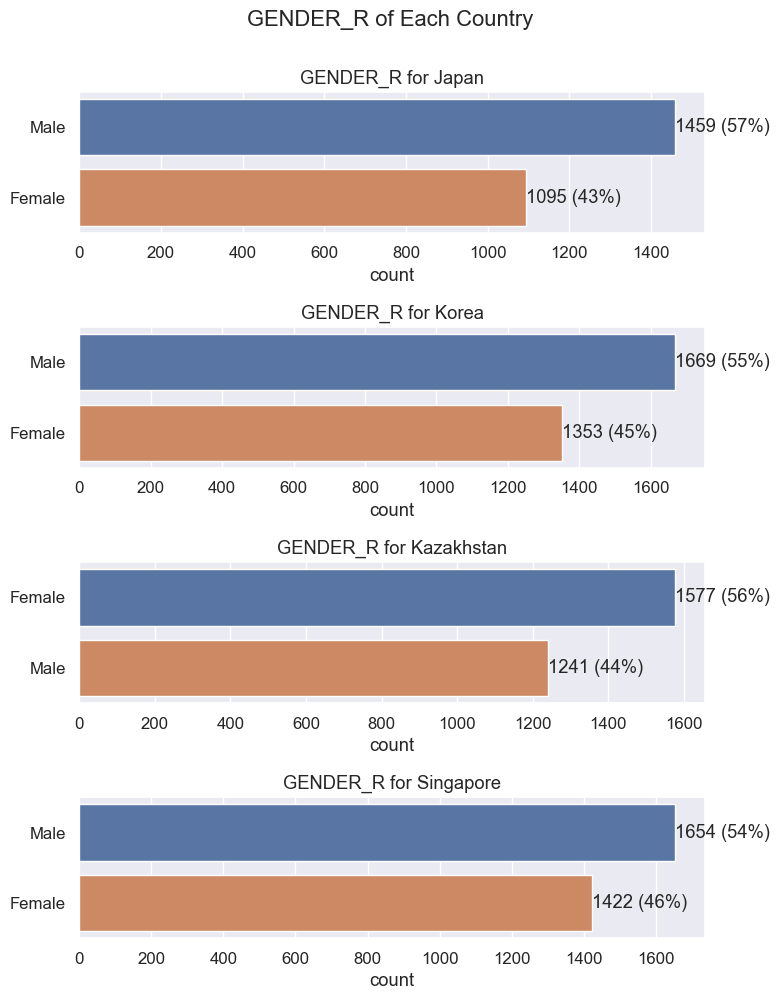

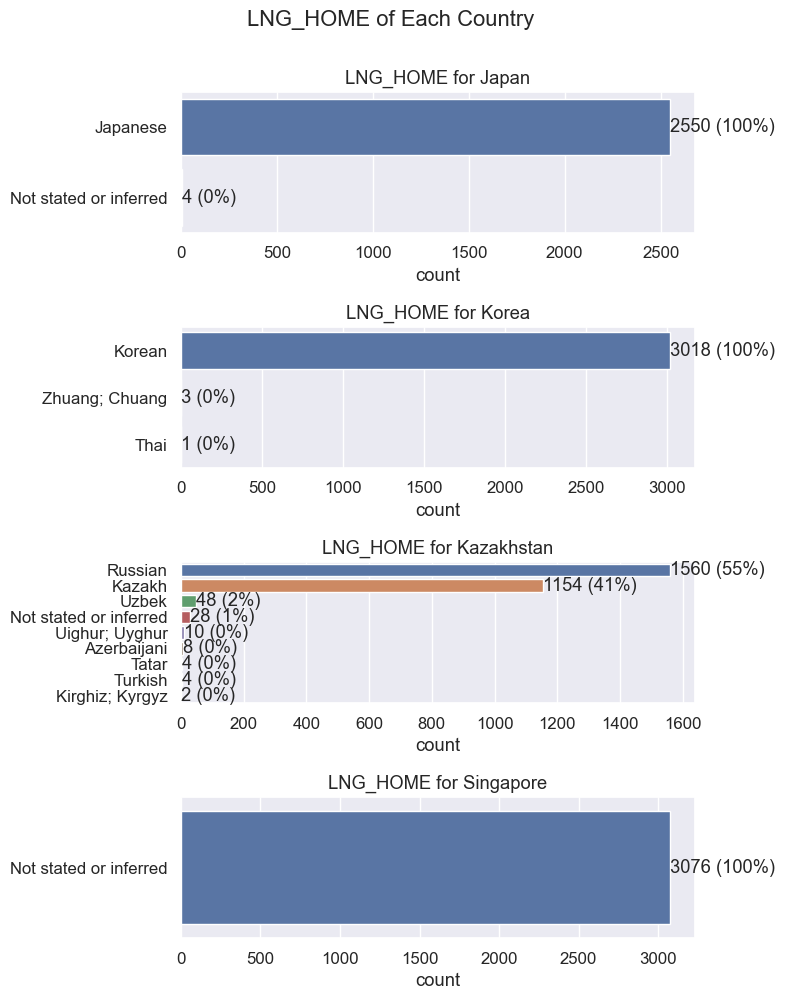

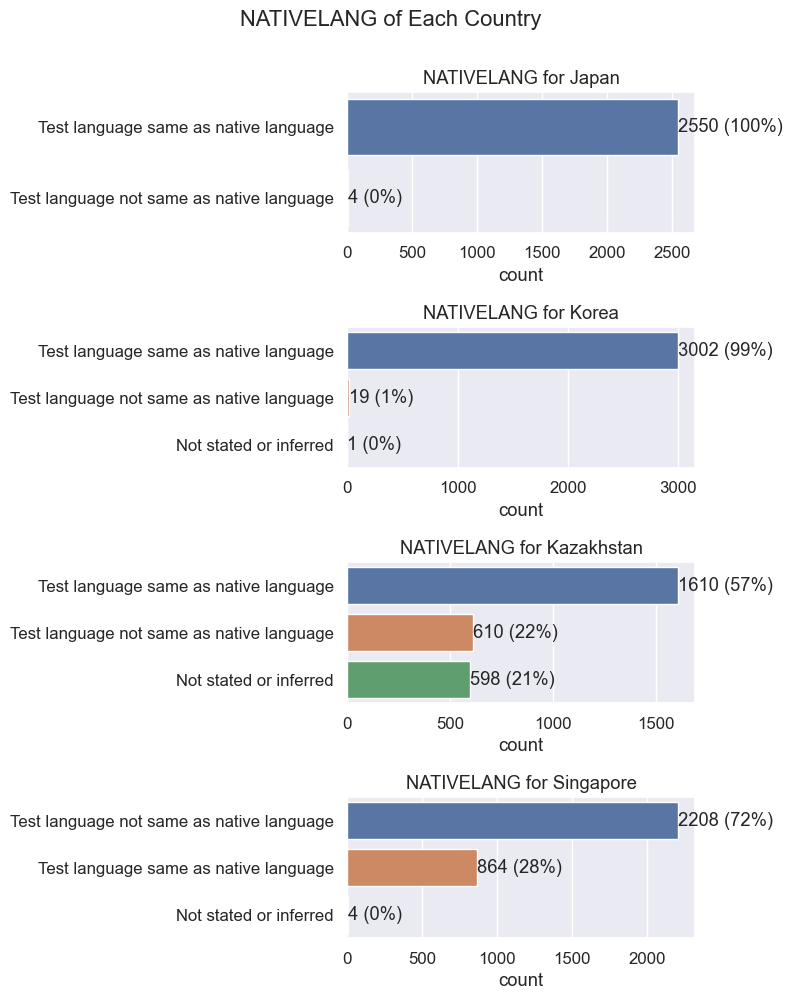

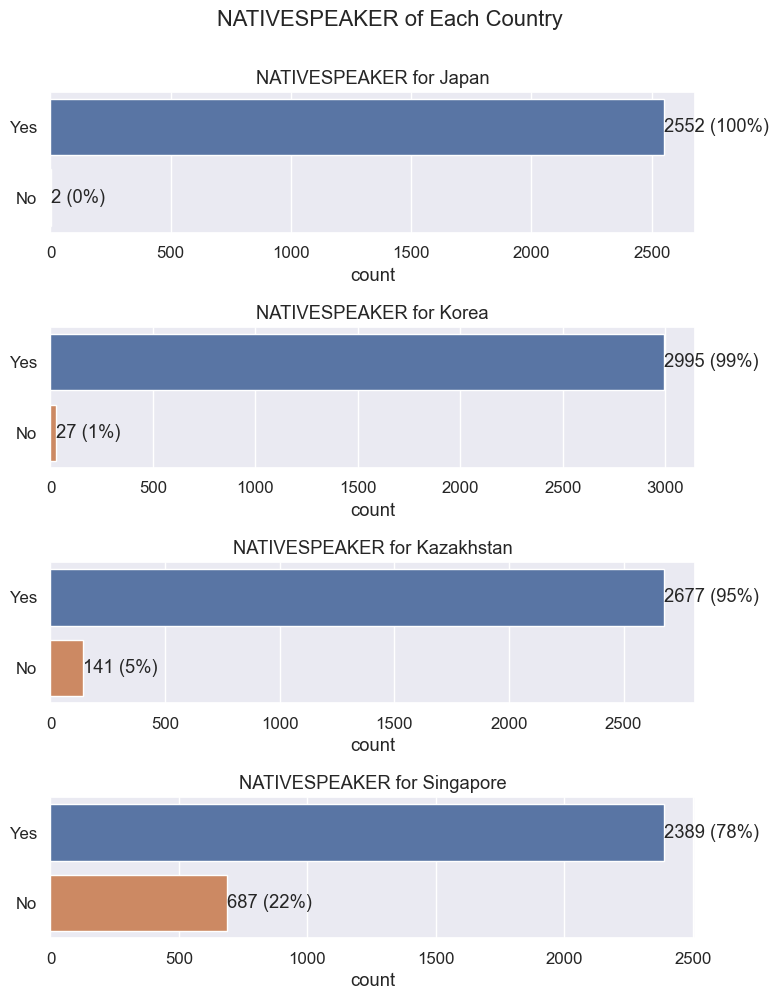

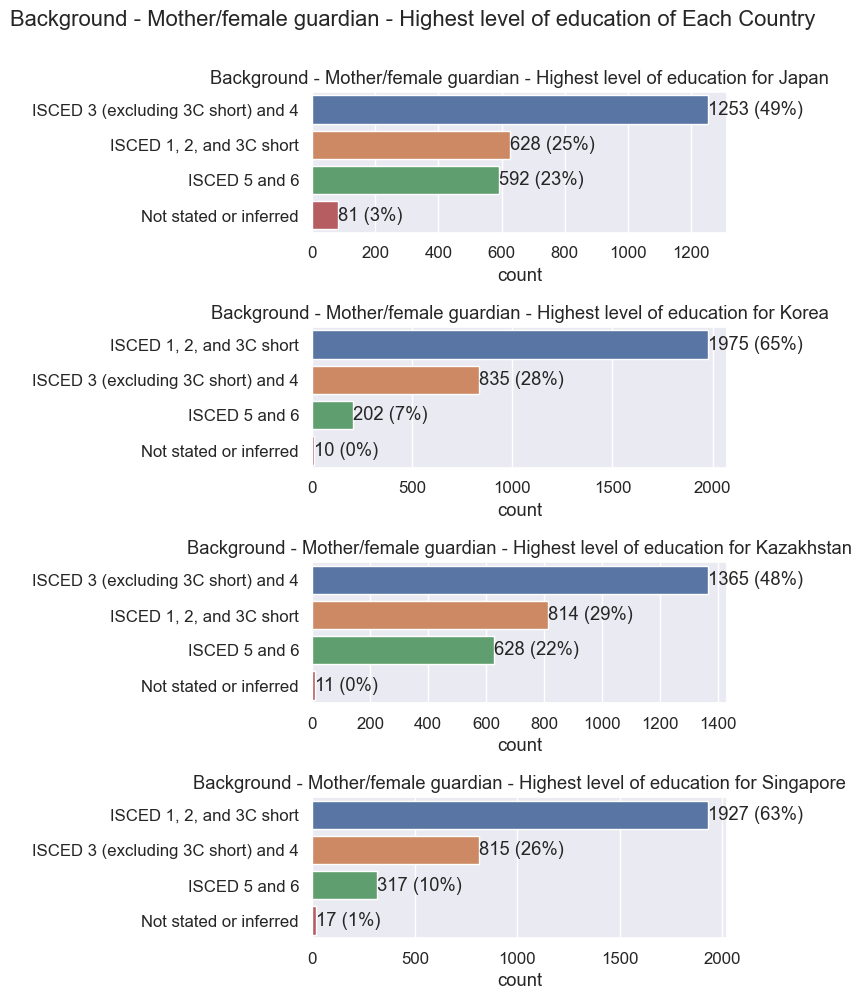

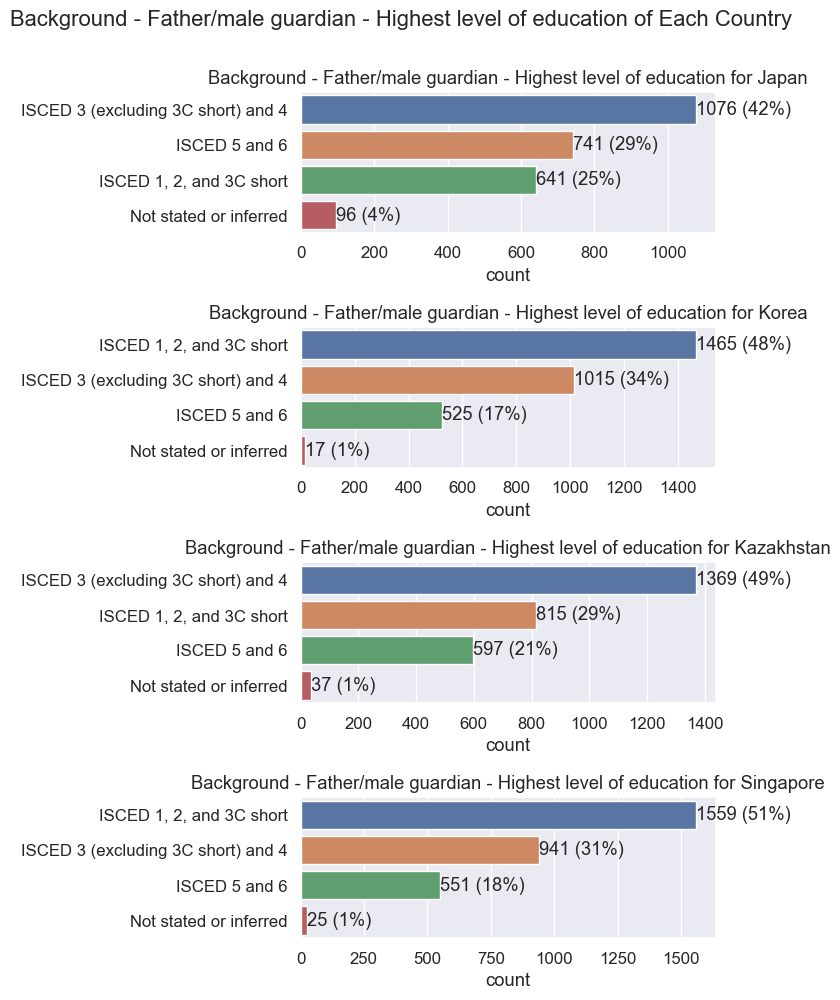

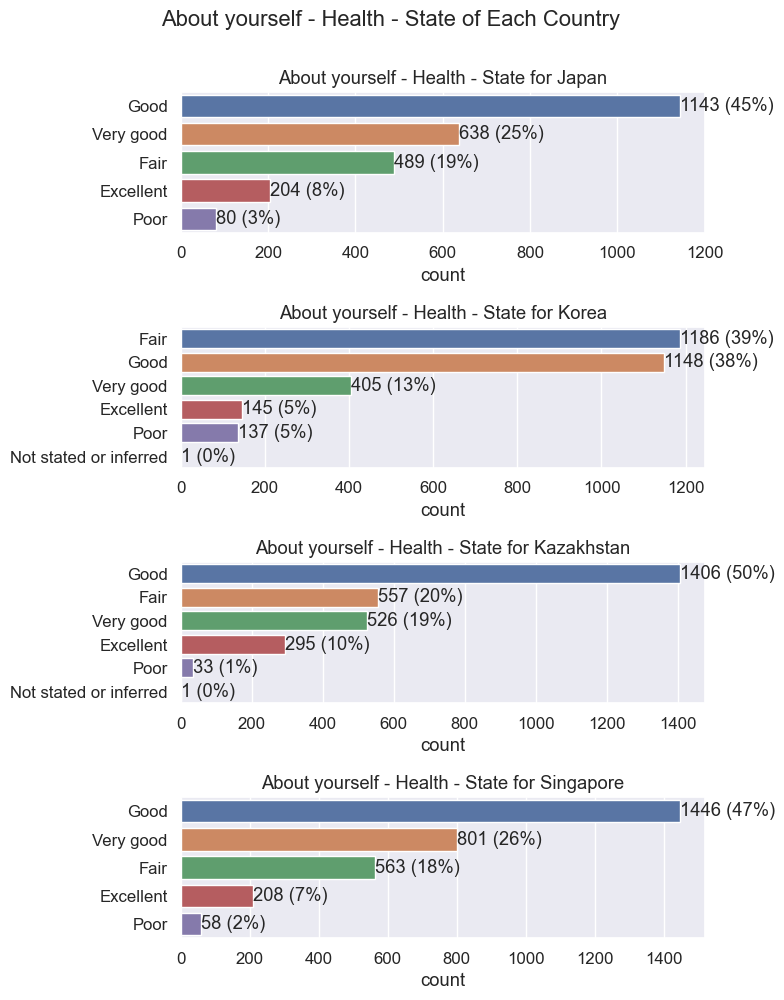

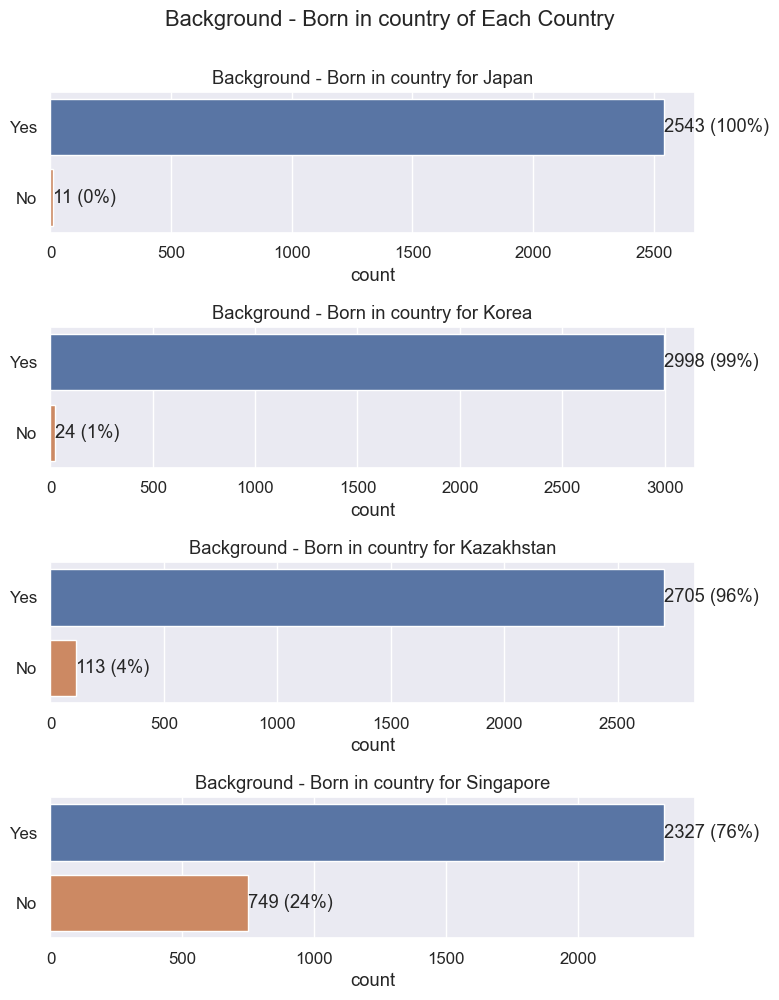

In [100]:
for col in demographic_mapped[2:]:
    plt.figure(figsize=(8, 10))
    for i in range(len(countries)):
        current = df[df['CNTRYID']  == countries[i]]
        
        # making the subplots
        plt.subplot(4,1,i+1)
        ax = sns.countplot(y=current[col],
                        order=current[col].value_counts(ascending=False).index);
                
        abs_values = current[col].value_counts(ascending=False)
        rel_values = current[col].value_counts(ascending=False, normalize=True).values * 100
        lbls = [f'{p[0]} ({p[1]:.0f}%)' for p in zip(abs_values, rel_values)]
        
        ax.bar_label(container=ax.containers[0], labels=lbls)

        plt.title(col + ' for ' + countries[i])
        plt.ylabel('')
    plt.suptitle(col + ' of Each Country', y=1)
    plt.tight_layout()
    plt.show()

## Education and Work

In [101]:
df[eduwork_mapped].dtypes

CNTRYID                                                                                  object
Current status/work history - Subjective status                                          object
Current status/work history - Current - Paid job or family business (DERIVED BY CAPI)    object
Education - Highest qualification - Level                                                object
Education - Highest qualification - Level of foreign qualification                       object
Education - Highest qualification - Area of study                                        object
Current work - Requirements - Education level                                            object
Education - Formal qualification - Reason job related                                    object
Education - Formal qualification - Employed - Useful for job                             object
Current work - Job satisfaction                                                          object
ISCOSKIL4                               

In [102]:
ignore = ['Current work - Hours/week', 'NFEHRS', 'ISCO1C', 'ISCO2C']

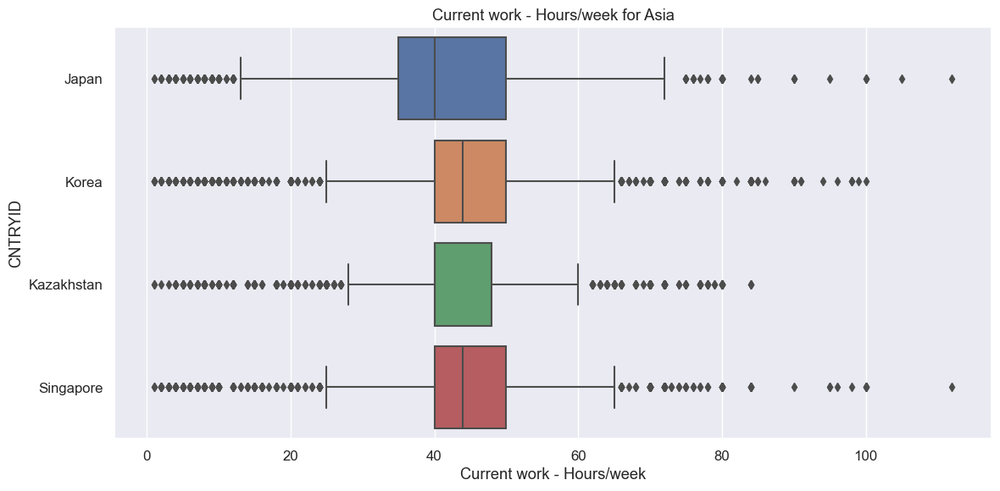

Background - Born in country  :  Japan
Q1: 35.0
Median: 40.0
Q3: 50.0
IQR: 15.0

Background - Born in country  :  Korea
Q1: 40.0
Median: 44.0
Q3: 50.0
IQR: 10.0

Background - Born in country  :  Kazakhstan
Q1: 40.0
Median: 40.0
Q3: 48.0
IQR: 8.0

Background - Born in country  :  Singapore
Q1: 40.0
Median: 44.0
Q3: 50.0
IQR: 10.0



In [103]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x=ignore[0], y='CNTRYID')

plt.title(ignore[0] + ' for Asia')
plt.tight_layout()
plt.show()

for i in range(len(countries)):
    current = df[df['CNTRYID'] == countries[i]]
    current = current[ignore[0]]
            
    q1 = np.percentile(current, 25)
    median = np.percentile(current, 50)
    q3 = np.percentile(current, 75)
    iqr = q3 - q1
    
    print(col, ' : ', countries[i])
    print("Q1:", q1)
    print("Median:", median)
    print("Q3:", q3)
    print("IQR:", iqr)
    print()

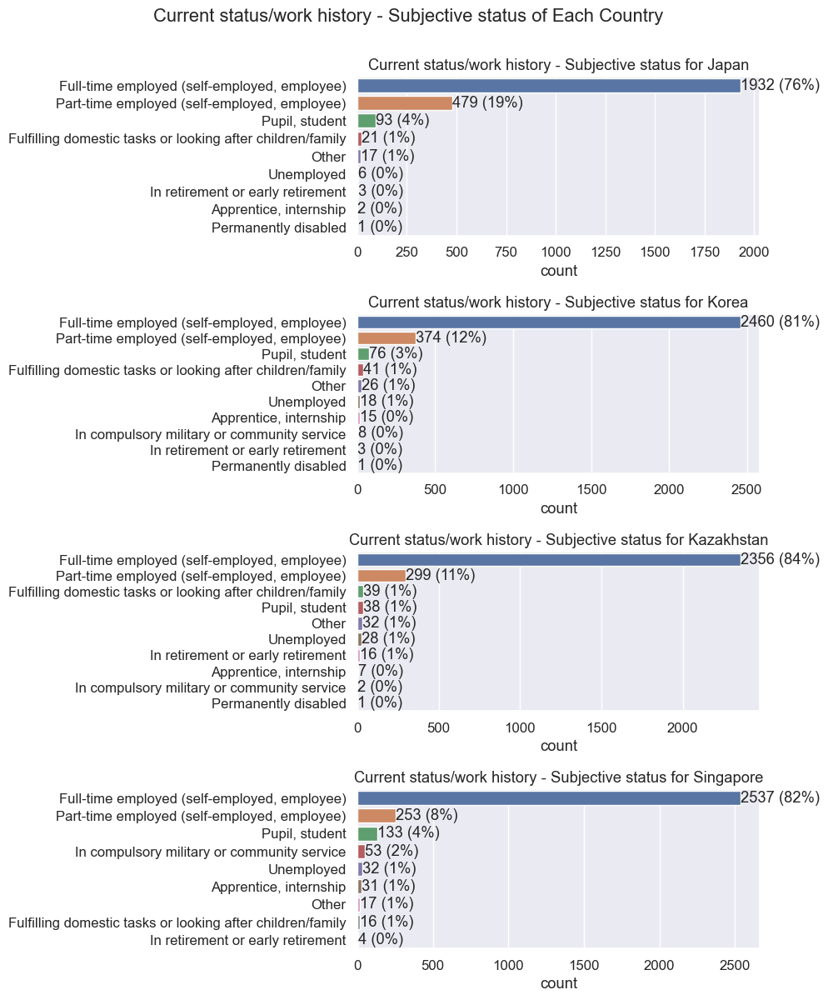

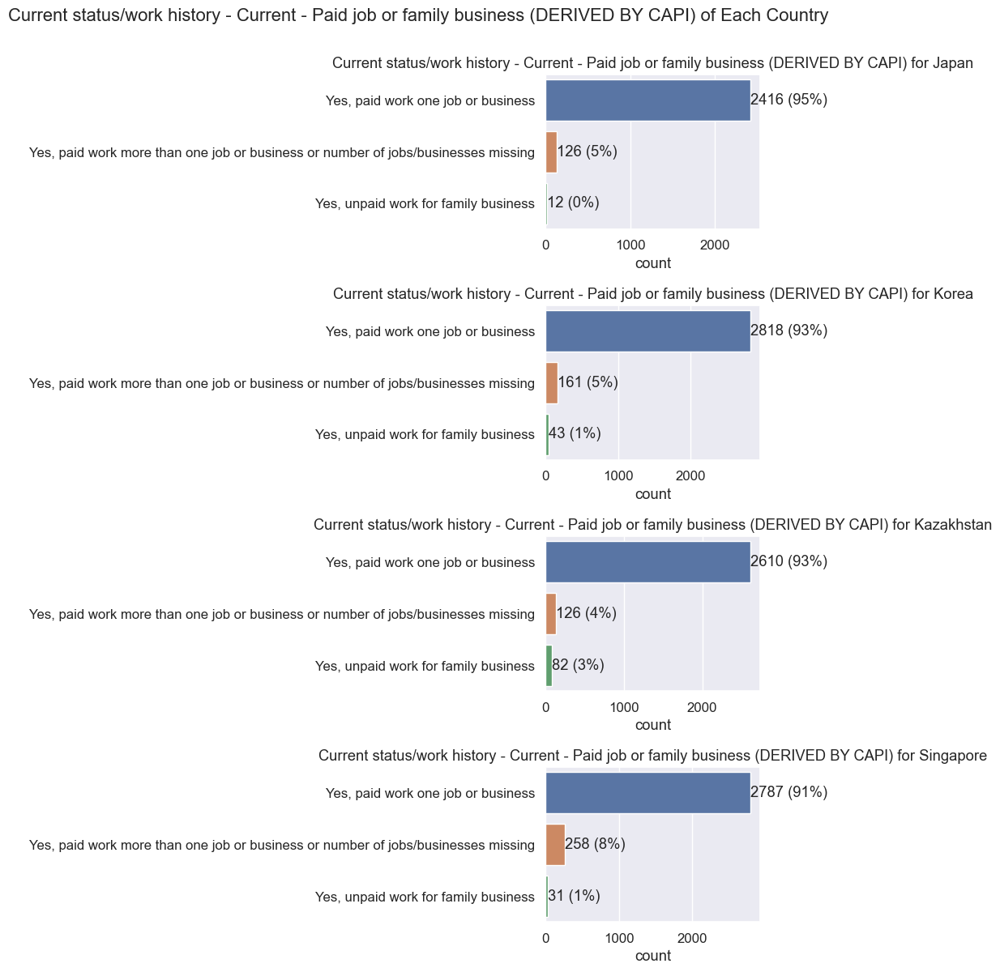

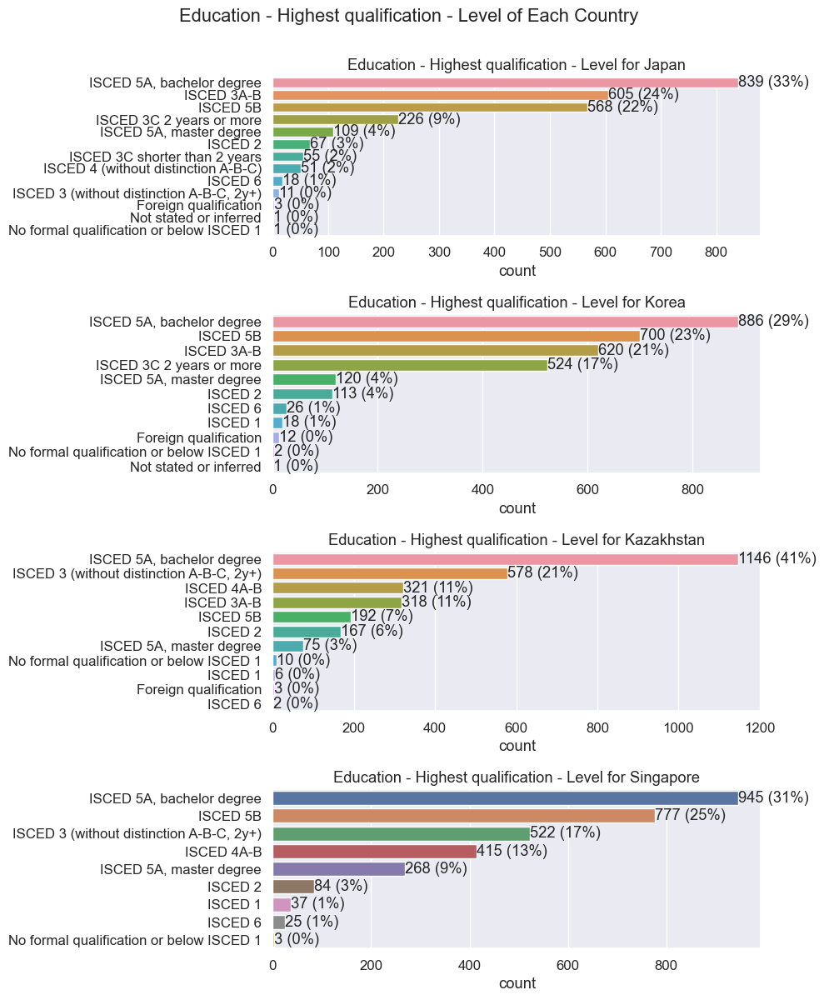

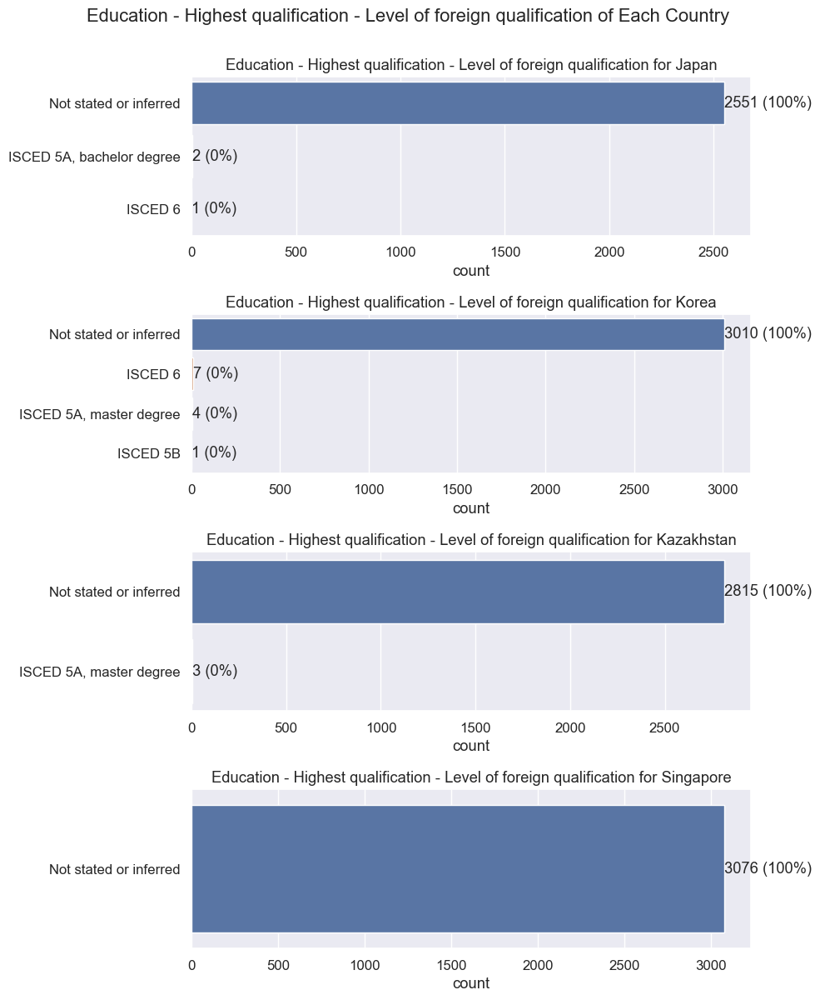

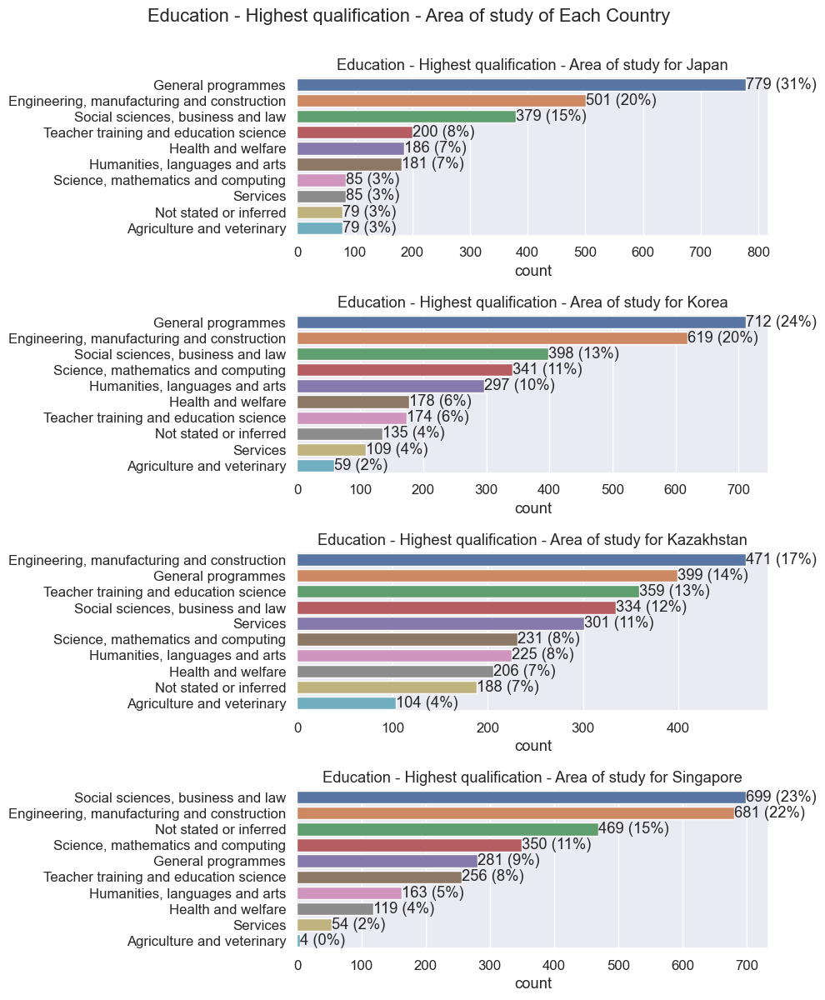

...

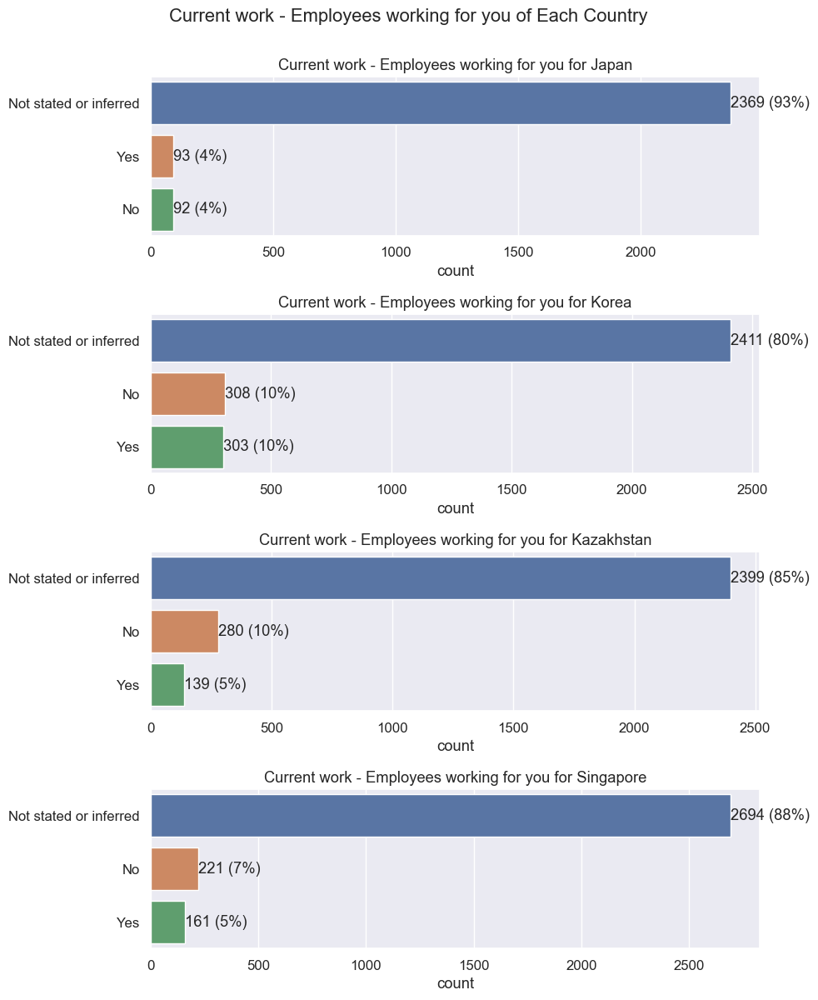

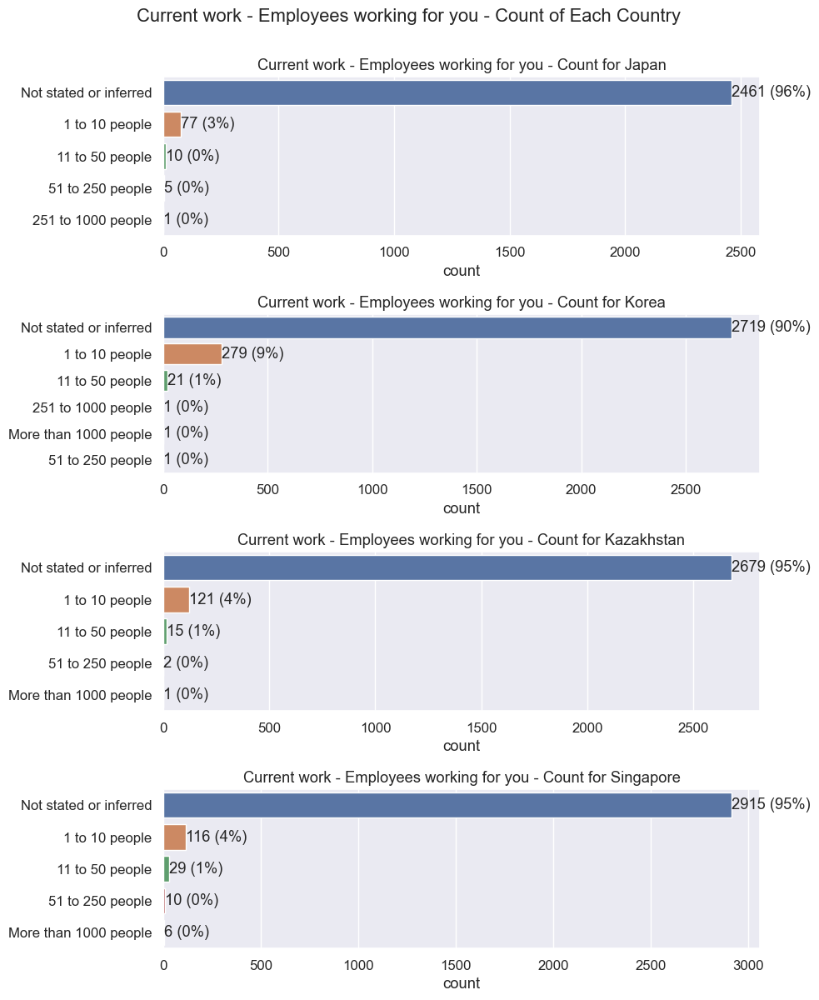

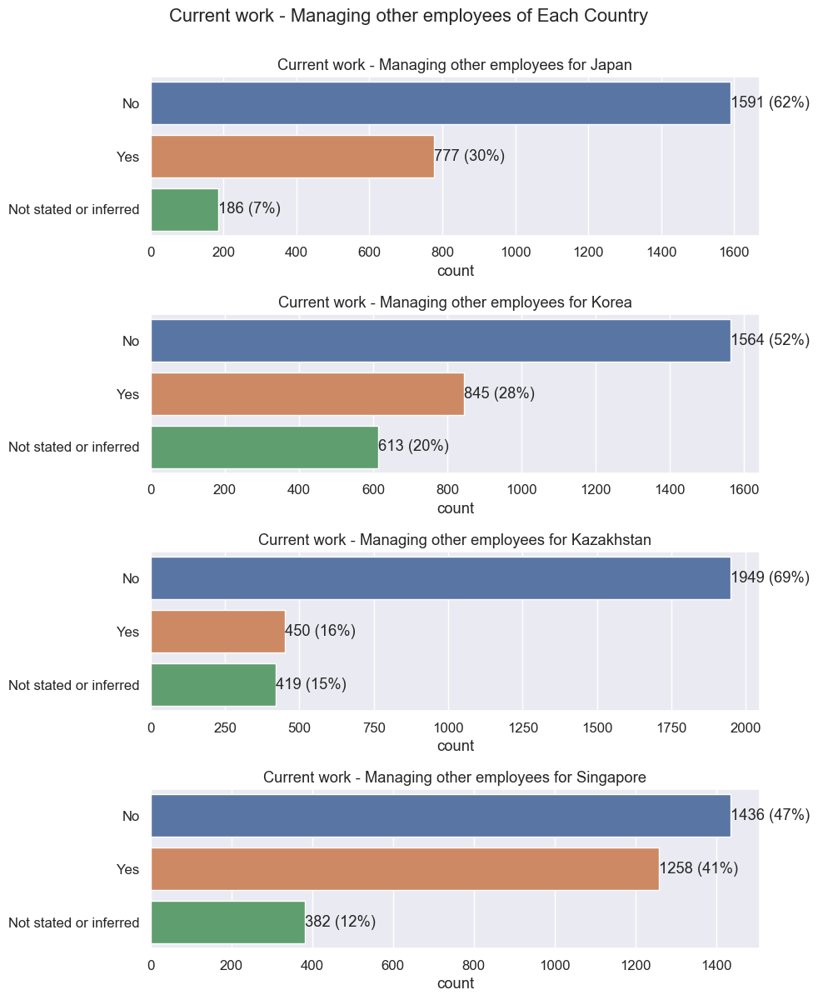

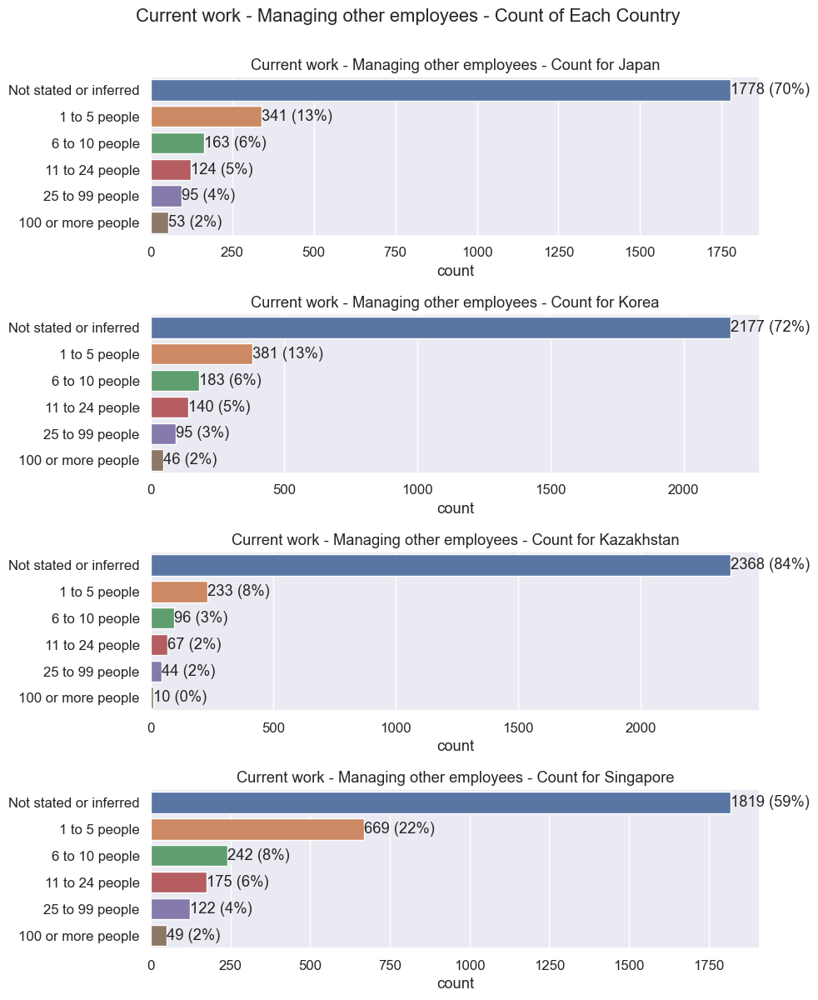

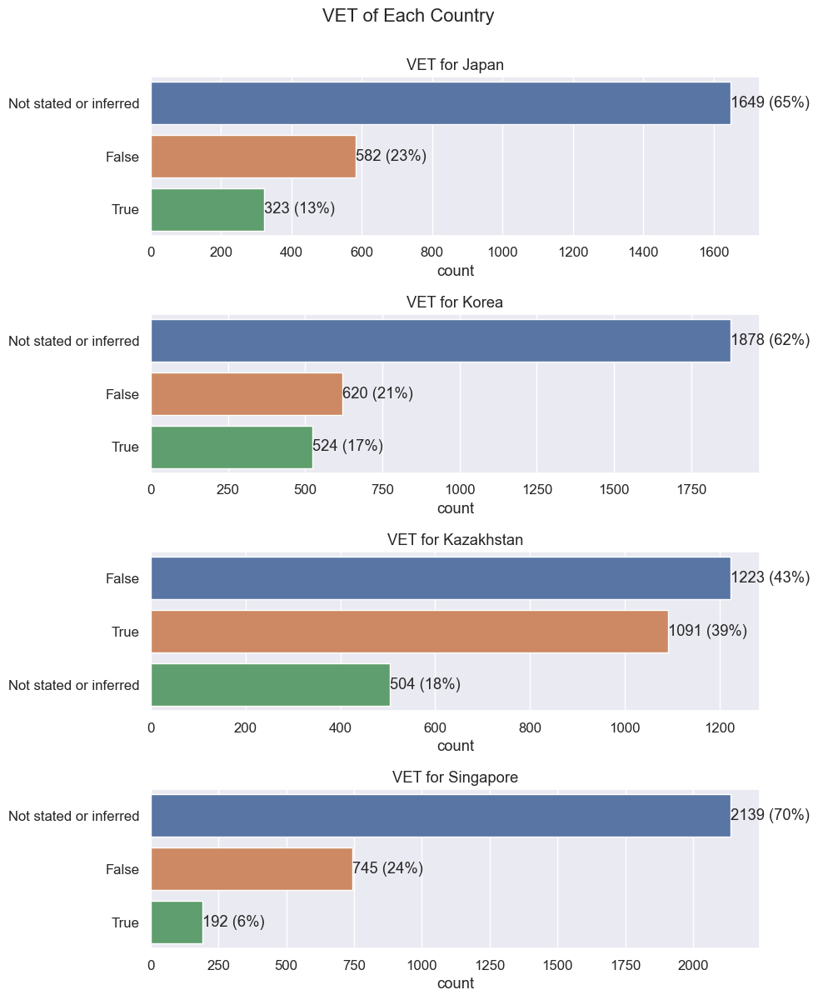

In [104]:
for col in eduwork_mapped[1:]:
    if col not in ignore:
        plt.figure(figsize=(10, 12))
        for i in range(len(countries)):
            current = df[df['CNTRYID']  == countries[i]]
            
            # making the subplots
            plt.subplot(4,1,i+1)
            ax = sns.countplot(y=current[col],
                            order=current[col].value_counts(ascending=False).index);
                    
            abs_values = current[col].value_counts(ascending=False)
            rel_values = current[col].value_counts(ascending=False, normalize=True).values * 100
            lbls = [f'{p[0]} ({p[1]:.0f}%)' for p in zip(abs_values, rel_values)]
            
            ax.bar_label(container=ax.containers[0], labels=lbls)

            plt.title(col + ' for ' + countries[i])
            plt.ylabel('')
        plt.suptitle(col + ' of Each Country', y=1)
        plt.tight_layout()
        plt.show()

## Skill Use at Work

In [105]:
df[worksl_mapped].dtypes

CNTRYID                                                                 object
ICTWORK                                                                float64
NFEHRSJR                                                                object
Skill use work - Time cooperating with co-workers                       object
Skill use work - How often - Sharing work-related info                  object
Skill use work - How often - Teaching people                            object
Skill use work - How often - Presentations                              object
Skill use work - How often - Selling                                    object
Skill use work - How often - Advising people                            object
Skill use work - How often - Planning own activities                    object
Skill use work - How often - Planning others activities                 object
Skill use work - How often - Organising own time                        object
Skill use work - How often - Influencing people     

In [106]:
ignore = ['ICTWORK', 'NFEHRSJR']

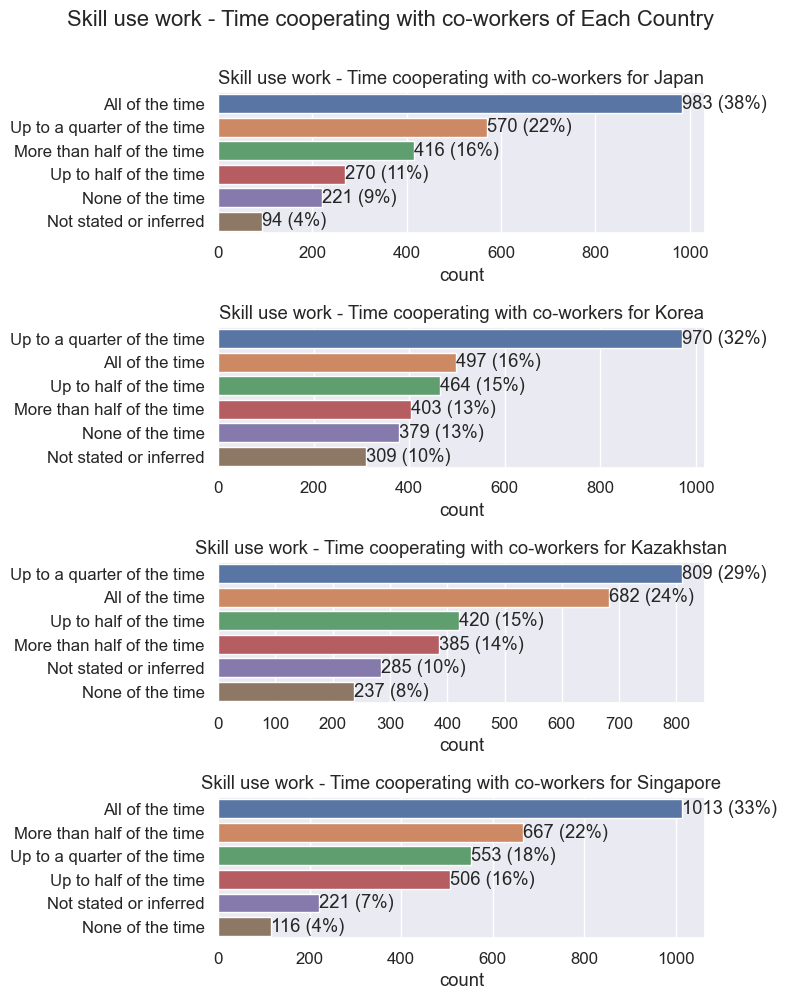

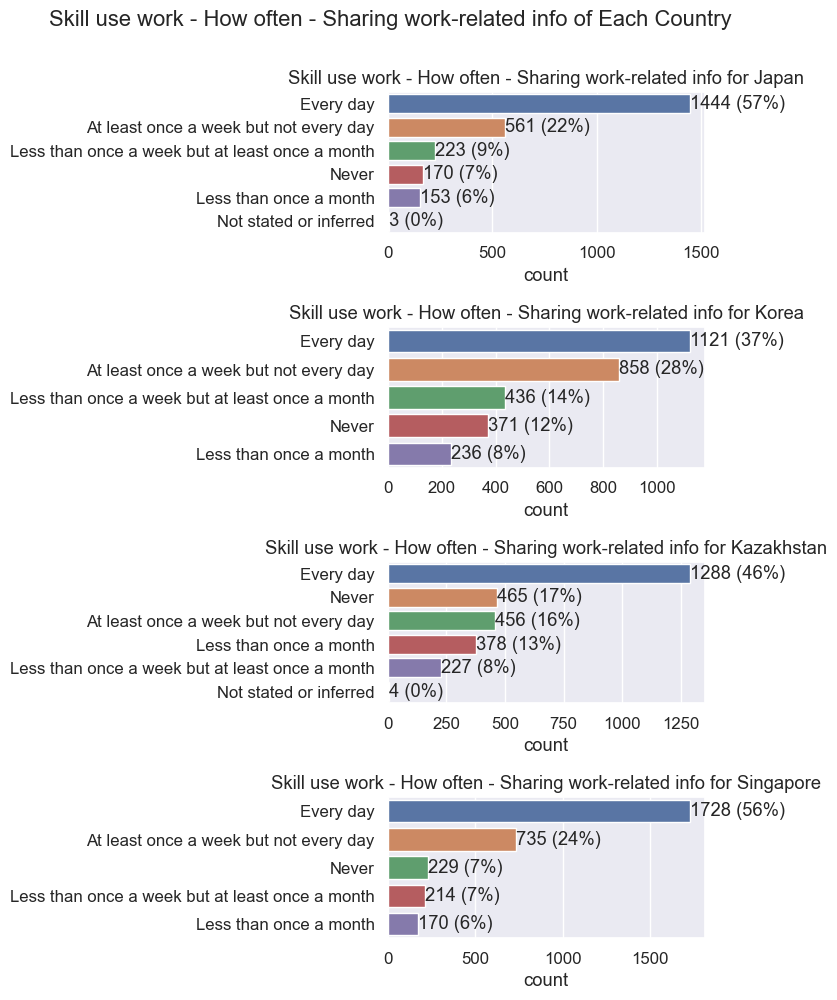

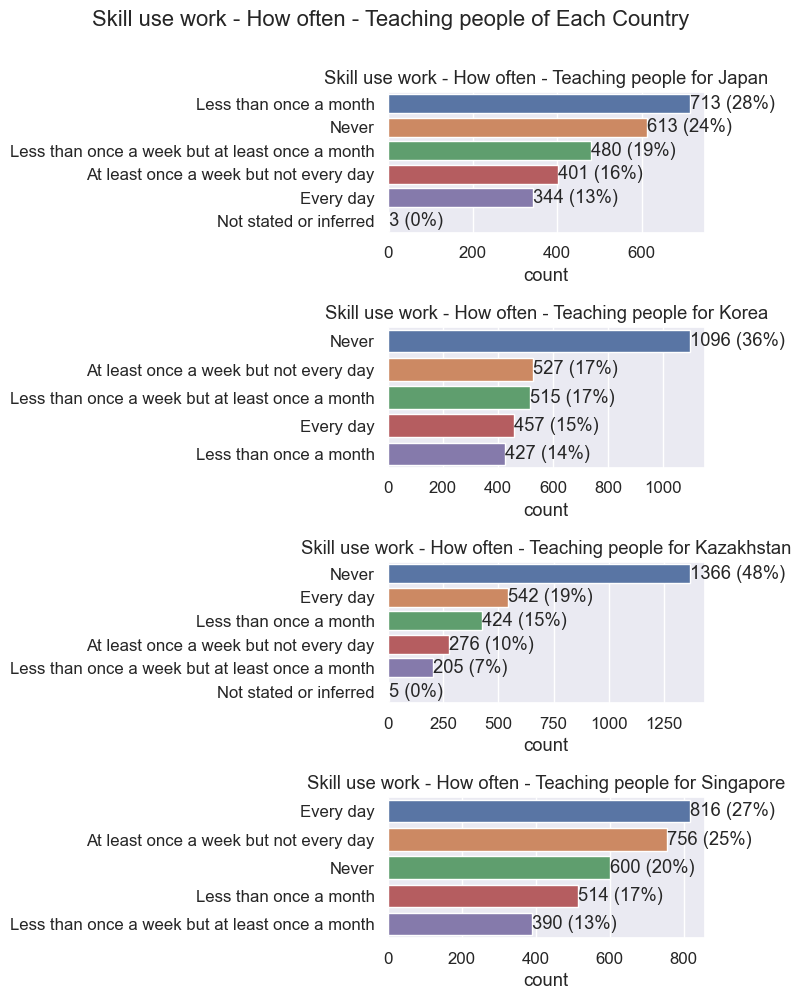

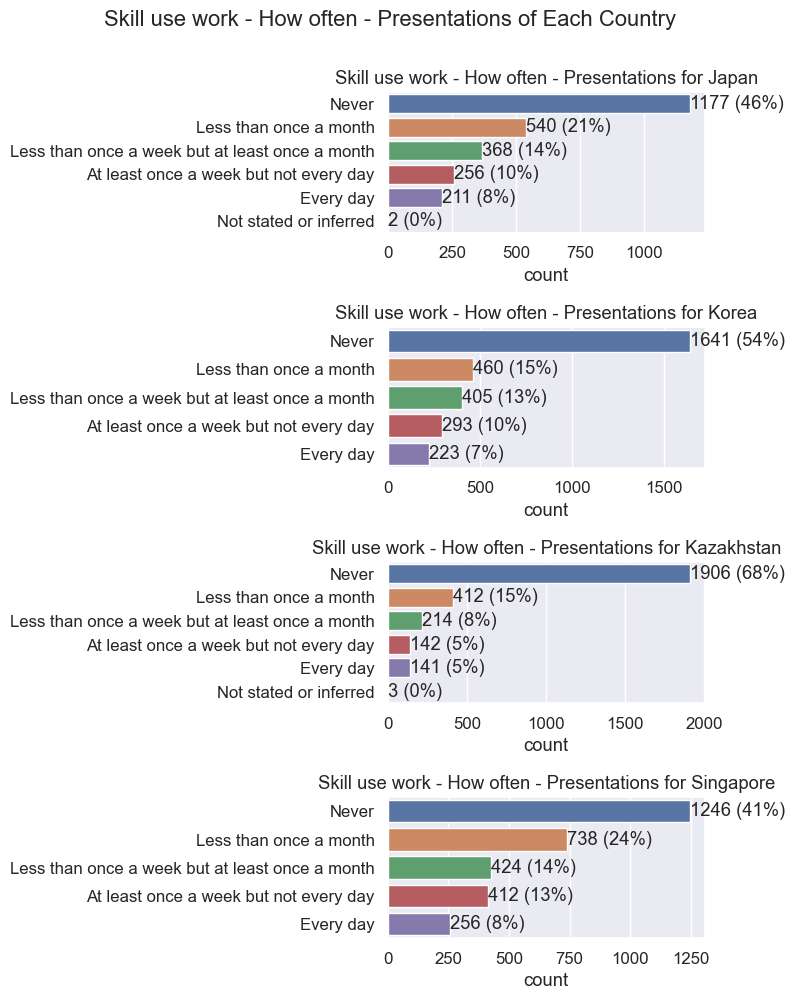

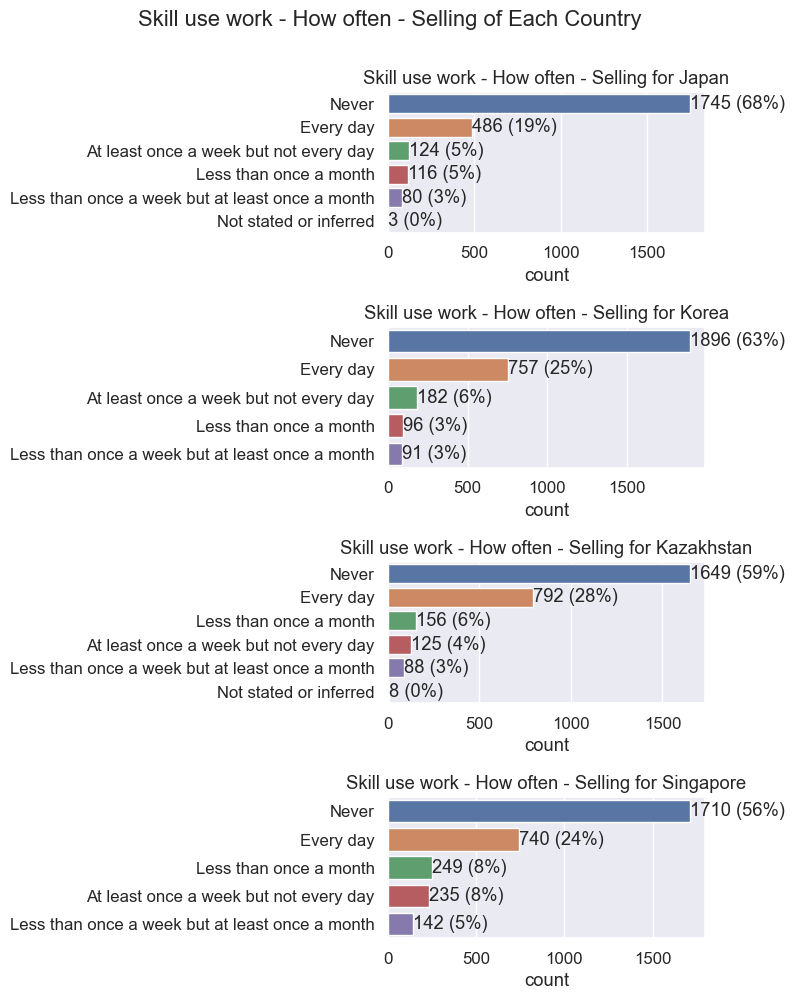

...

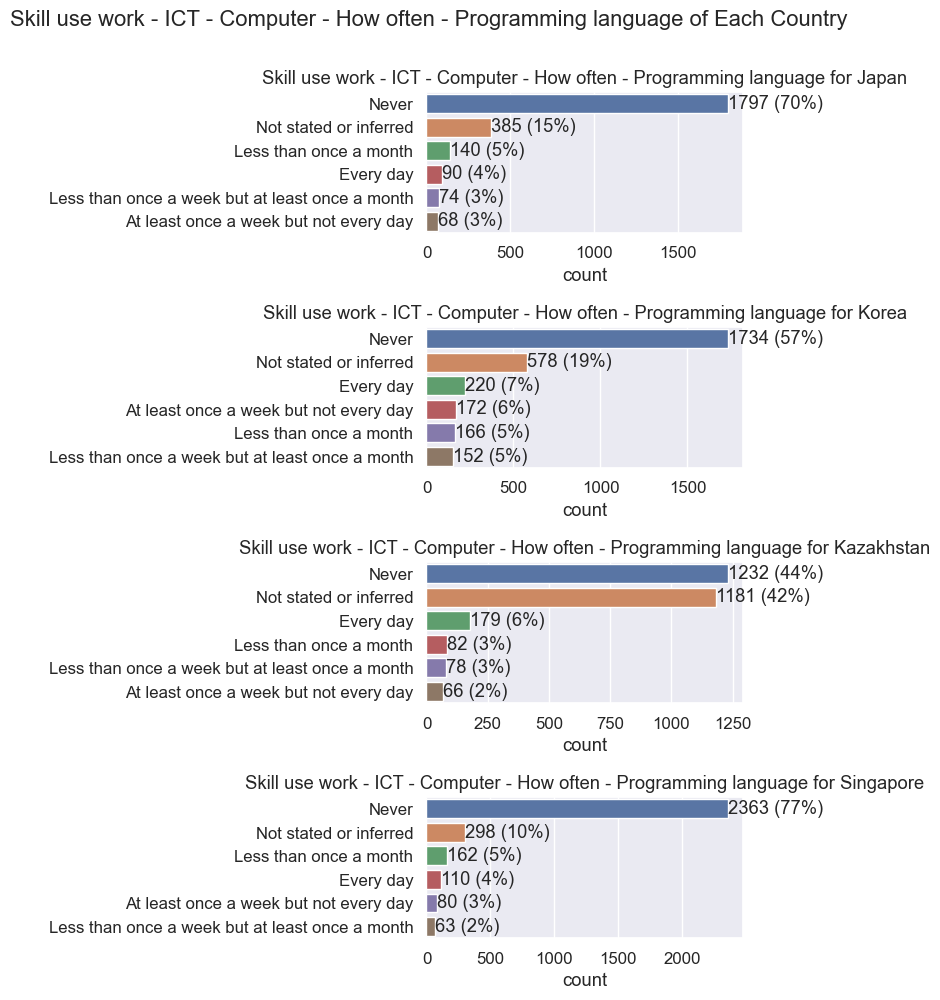

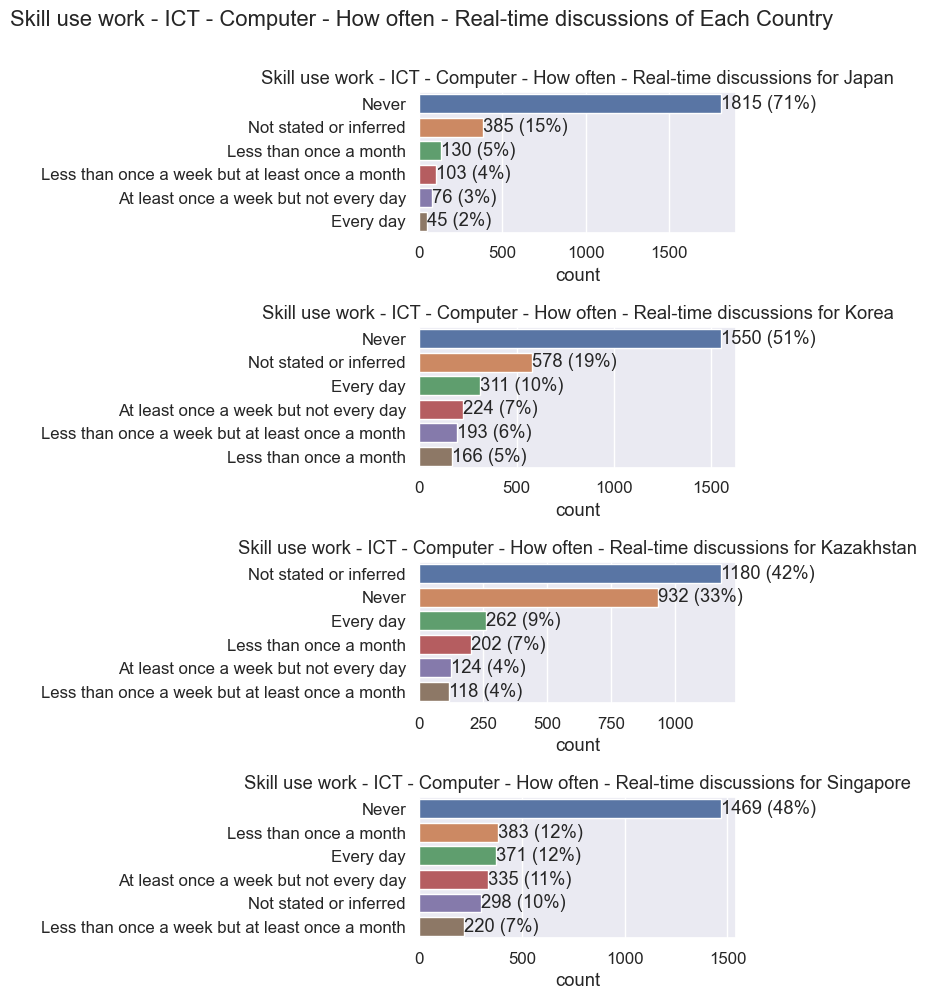

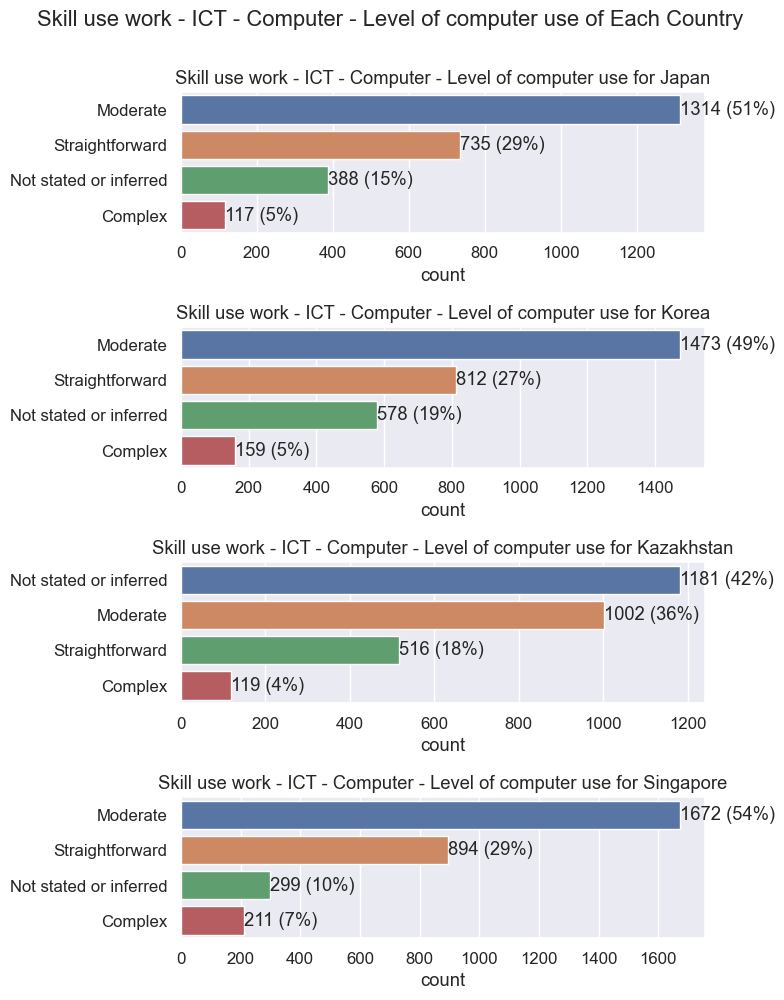

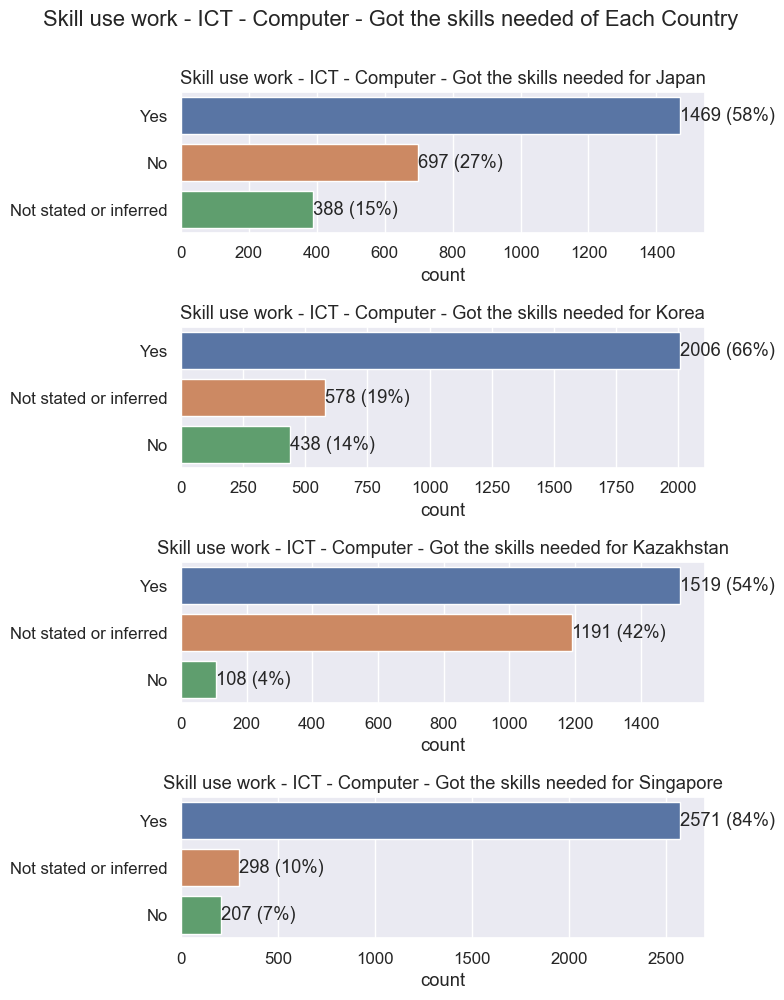

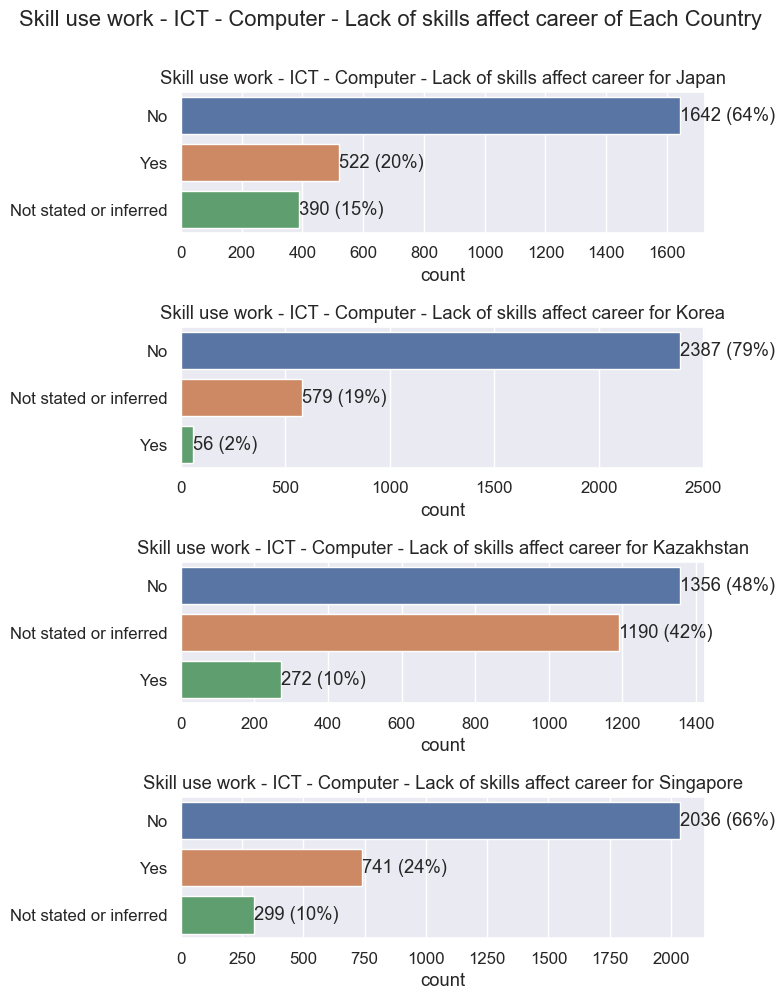

In [107]:
for col in worksl_mapped[1:]:
    if col not in ignore:
        plt.figure(figsize=(8, 10))
        for i in range(len(countries)):
            current = df[df['CNTRYID']  == countries[i]]
            
            # making the subplots
            plt.subplot(4,1,i+1)
            ax = sns.countplot(y=current[col],
                            order=current[col].value_counts(ascending=False).index);
                    
            abs_values = current[col].value_counts(ascending=False)
            rel_values = current[col].value_counts(ascending=False, normalize=True).values * 100
            lbls = [f'{p[0]} ({p[1]:.0f}%)' for p in zip(abs_values, rel_values)]
            
            ax.bar_label(container=ax.containers[0], labels=lbls)

            plt.title(col + ' for ' + countries[i])
            plt.ylabel('')
        plt.suptitle(col + ' of Each Country', y=1)
        plt.tight_layout()
        plt.show()

## Skill use in Life

In [108]:
df[lifesl_mapped].dtypes

CNTRYID                                                                                                 object
ICTHOME                                                                                                float64
NFEHRSNJR                                                                                               object
Skill use everyday life - ICT - Ever used computer                                                      object
Skill use everyday life - ICT - Experience with computer everyday life                                  object
Skill use everyday life - ICT - Internet - How often - For mail                                         object
Skill use everyday life - ICT - Internet - How often - In order to better understand various issues     object
Skill use everyday life - ICT - Internet - How often - Conduct transactions                             object
Skill use everyday life - ICT - Computer - How often - Spreadsheets                                     object
S

In [109]:
ignore = ['ICTHOME', 'NFEHRSNJR']

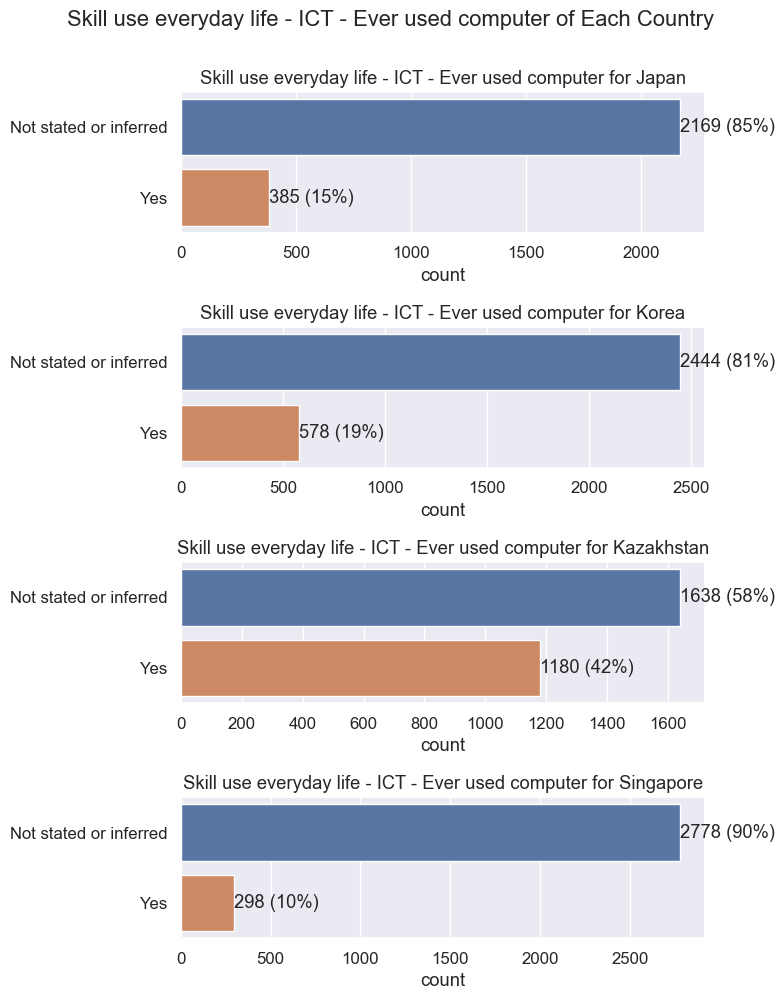

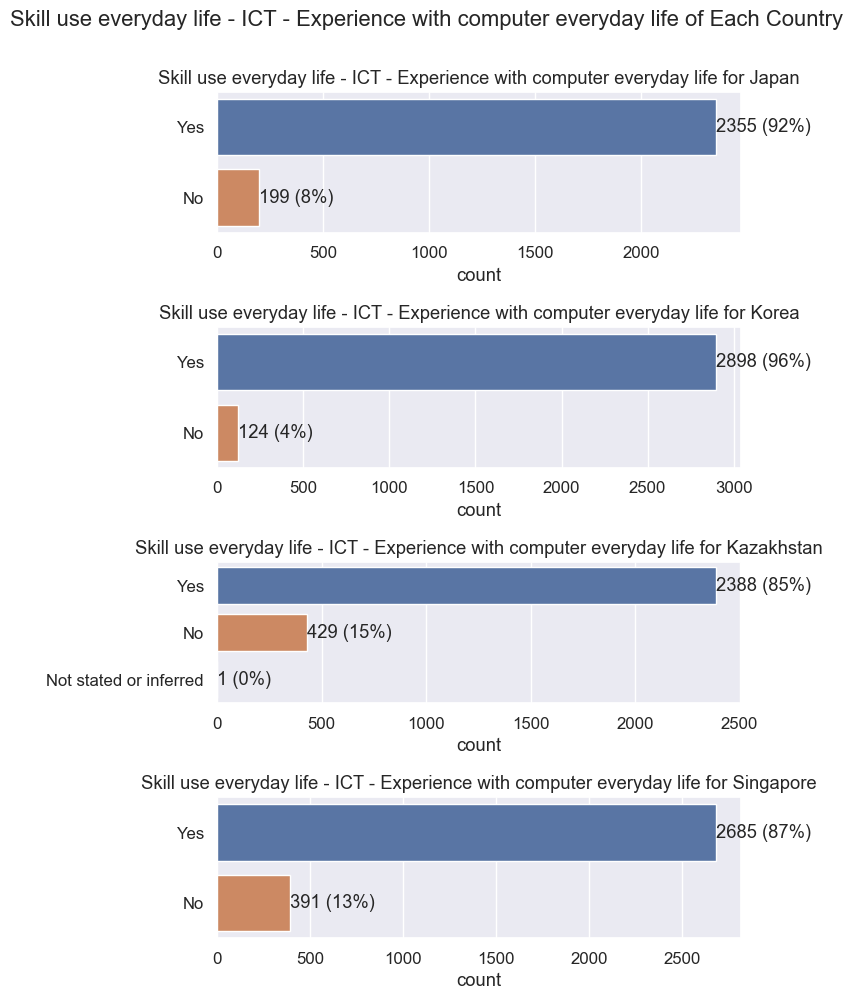

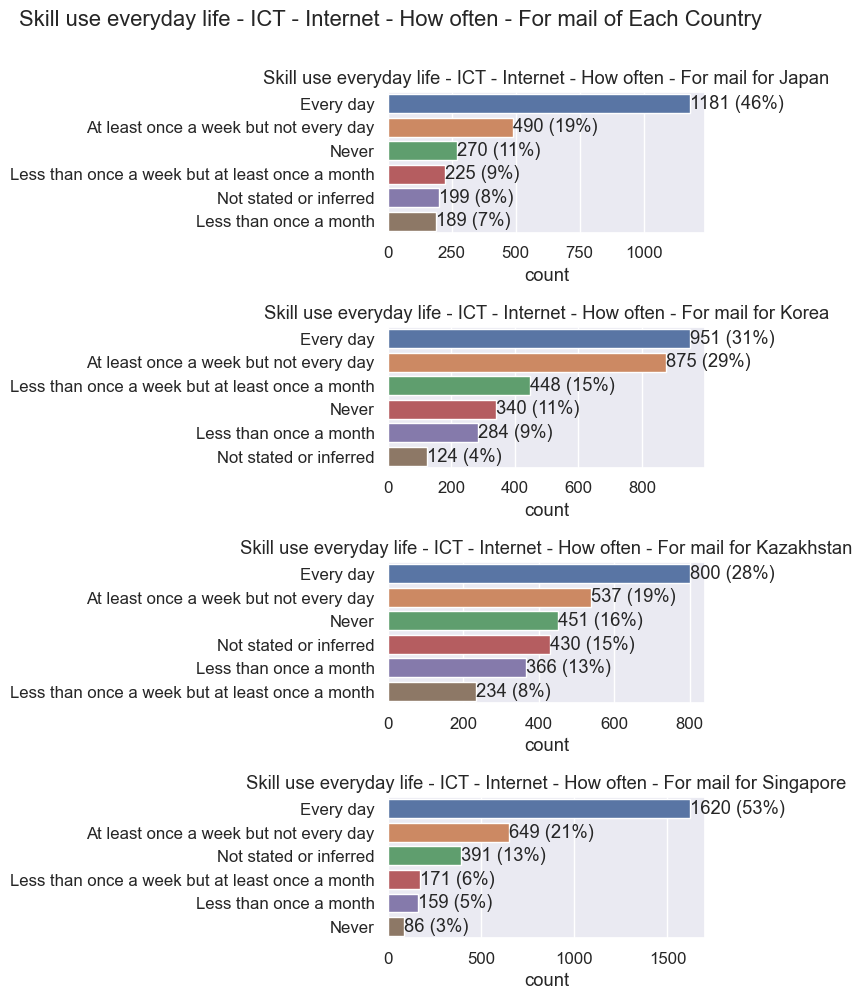

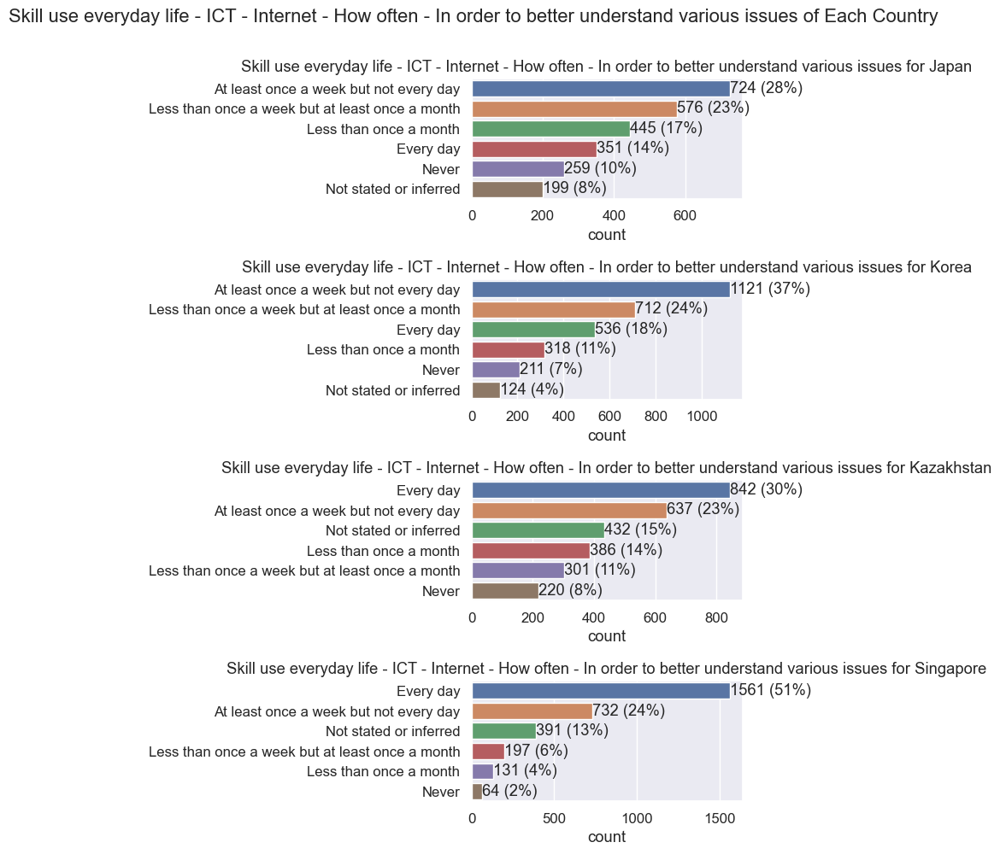

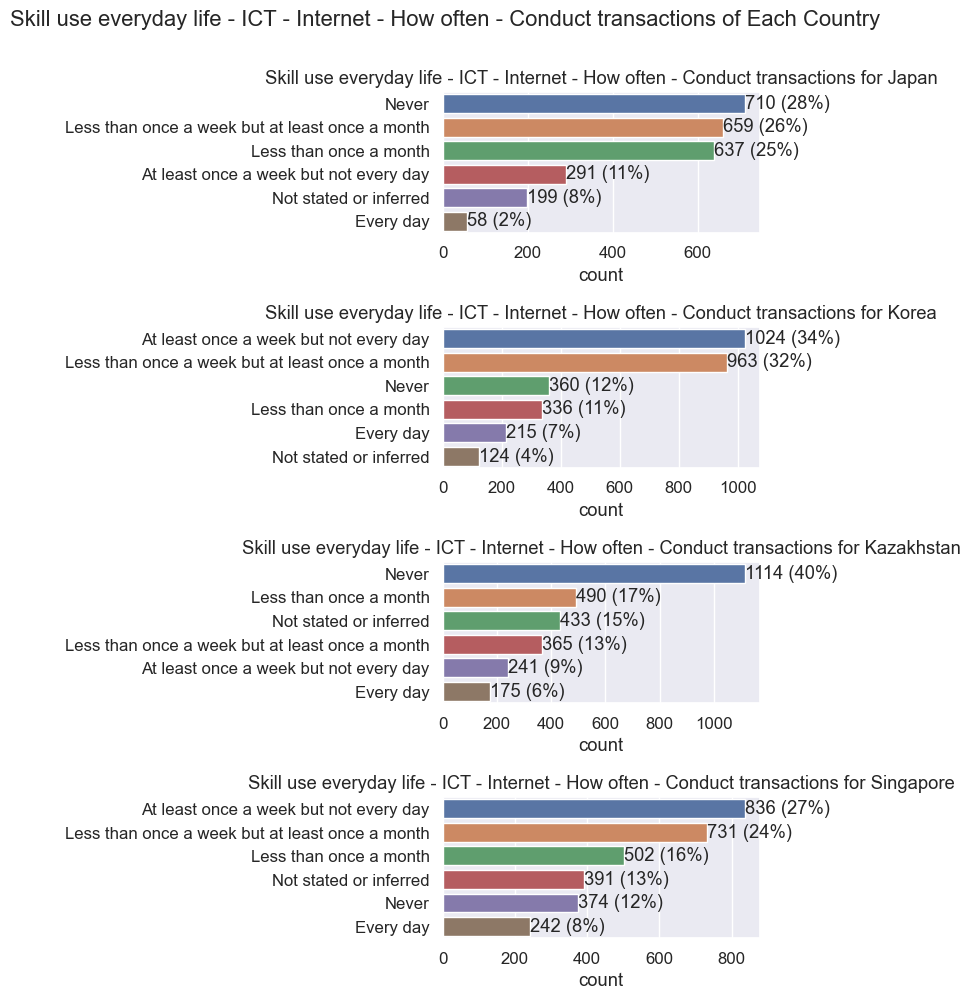

...

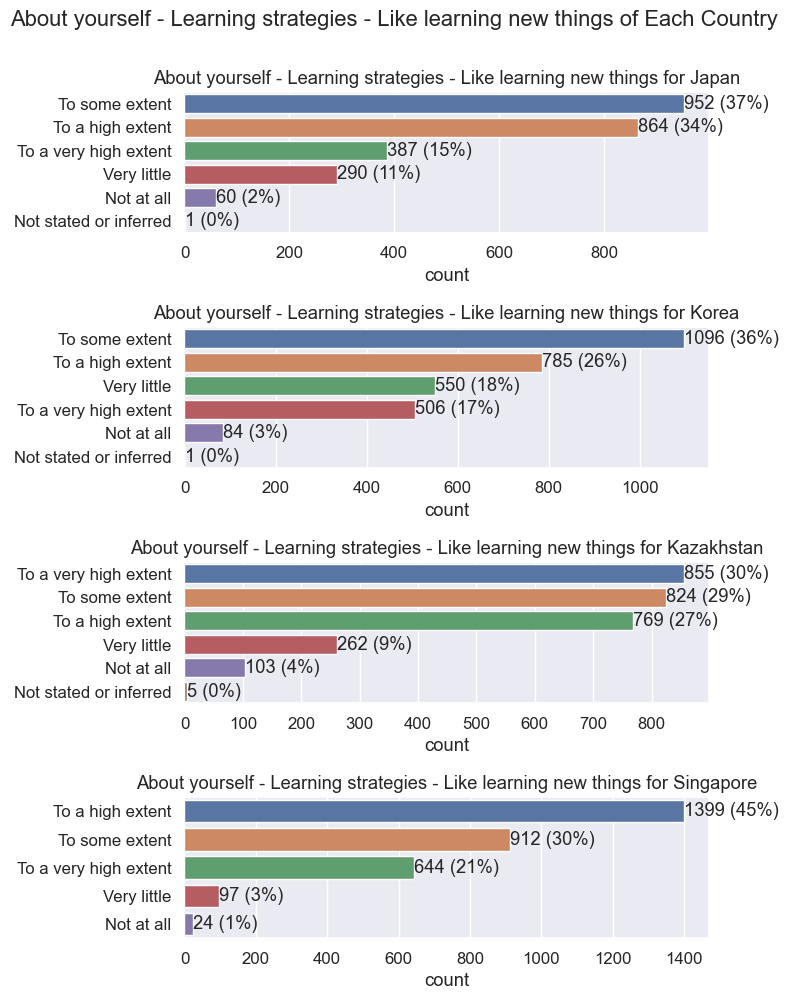

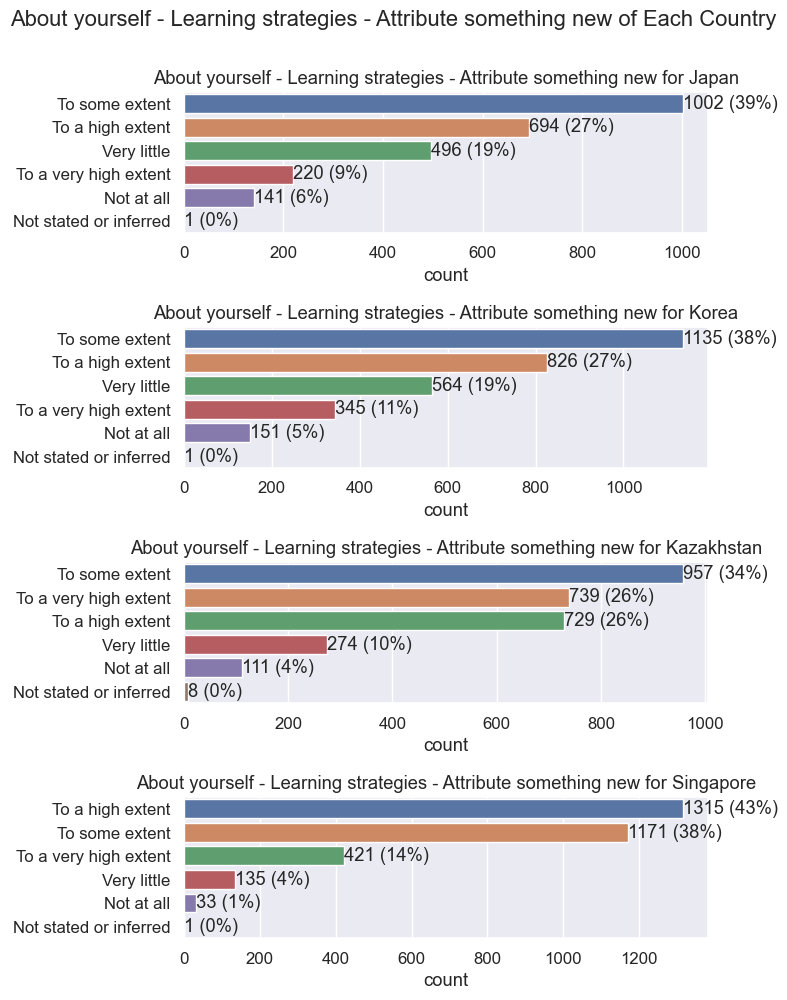

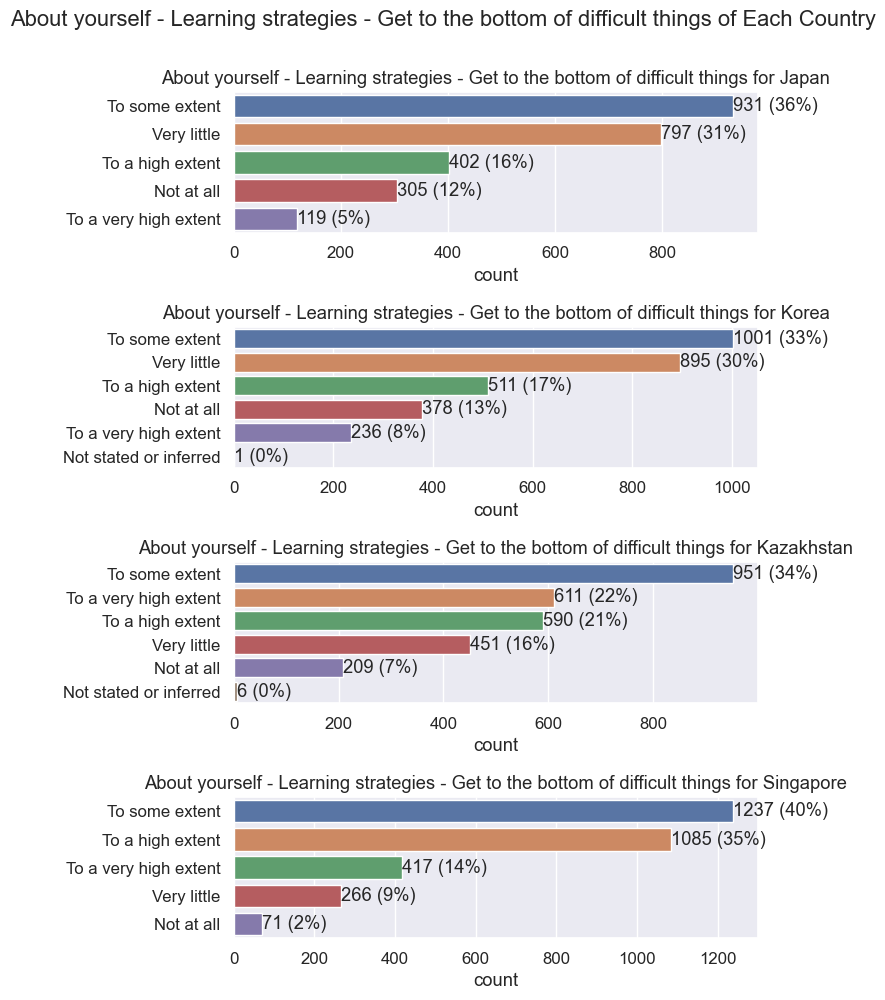

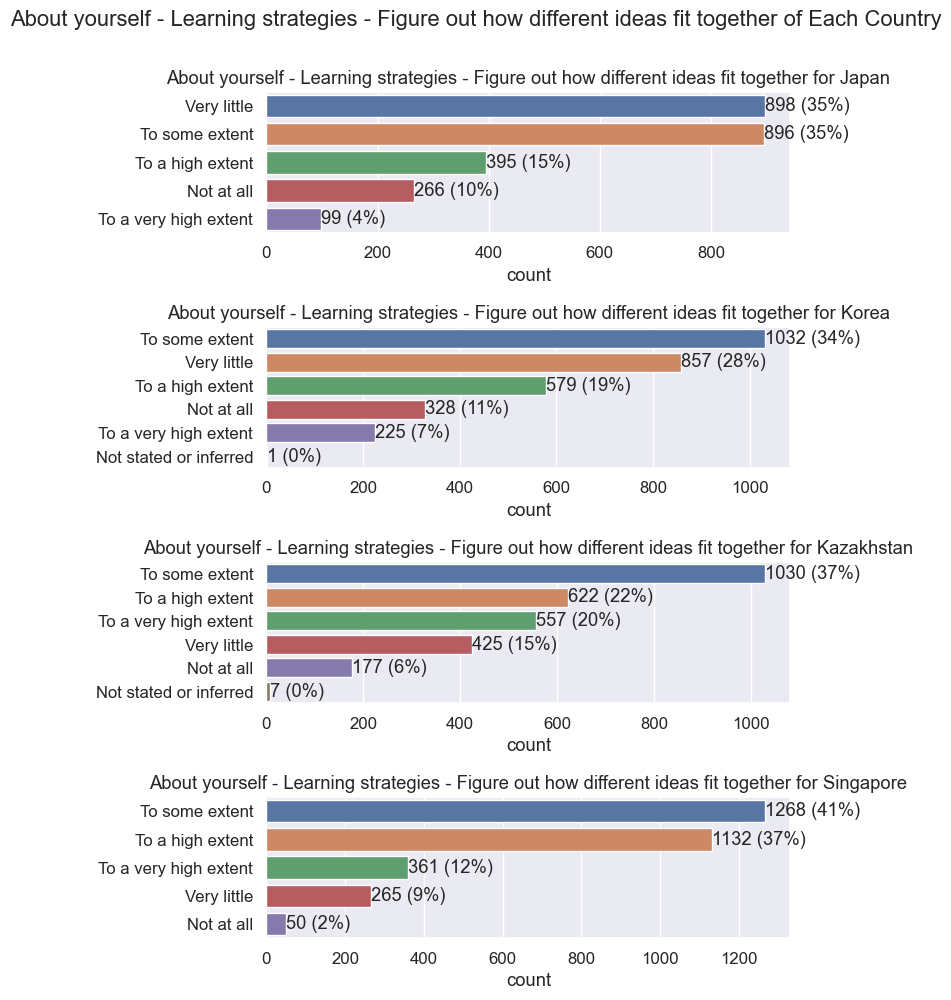

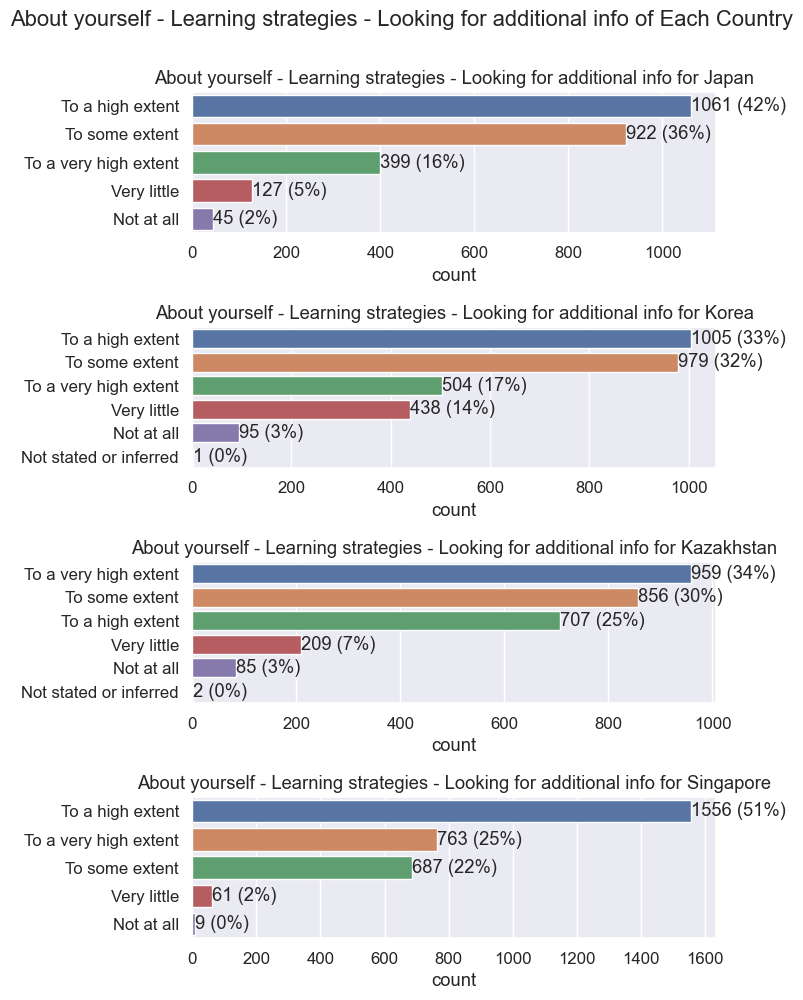

In [110]:
for col in lifesl_mapped[1:]:
    if col not in ignore:
        plt.figure(figsize=(8, 10))
        for i in range(len(countries)):
            current = df[df['CNTRYID']  == countries[i]]
            
            # making the subplots
            plt.subplot(4,1,i+1)
            ax = sns.countplot(y=current[col],
                            order=current[col].value_counts(ascending=False).index);
                    
            abs_values = current[col].value_counts(ascending=False)
            rel_values = current[col].value_counts(ascending=False, normalize=True).values * 100
            lbls = [f'{p[0]} ({p[1]:.0f}%)' for p in zip(abs_values, rel_values)]
            
            ax.bar_label(container=ax.containers[0], labels=lbls)

            plt.title(col + ' for ' + countries[i])
            plt.ylabel('')
        plt.suptitle(col + ' of Each Country', y=1)
        plt.tight_layout()
        plt.show()

# END